In [1]:
import pandas as pd
import numpy as np
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

In [3]:
complaints = pd.read_csv("complaints.csv")

climate = pd.read_csv("climate-change.csv")
finance = pd.read_csv("financial-sector.csv")
health = pd.read_csv("health.csv")
poverty = pd.read_csv("poverty.csv")
social = pd.read_csv("social-development.csv")
urban = pd.read_csv("urban-development.csv")

## Complaints

In [6]:
print(complaints.columns)
complaints
# Optional: convert years to numeric
complaints['year_received'] = pd.to_numeric(complaints['year_received'], errors='coerce')

Index(['unique_mos_id', 'first_name', 'last_name', 'command_now', 'shield_no',
       'complaint_id', 'month_received', 'year_received', 'month_closed',
       'year_closed', 'command_at_incident', 'rank_abbrev_incident',
       'rank_abbrev_now', 'rank_now', 'rank_incident', 'mos_ethnicity',
       'mos_gender', 'mos_age_incident', 'complainant_ethnicity',
       'complainant_gender', 'complainant_age_incident', 'fado_type',
       'allegation', 'precinct', 'contact_reason', 'outcome_description',
       'board_disposition'],
      dtype='object')


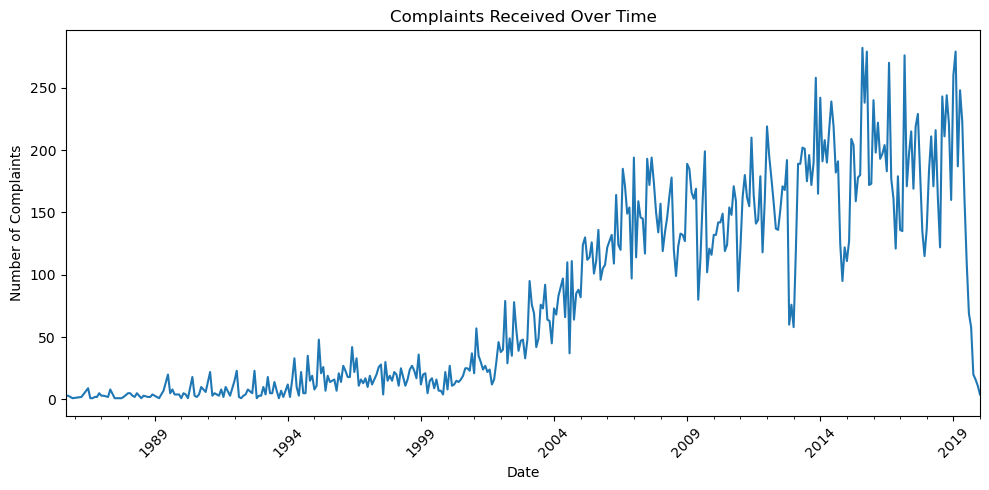

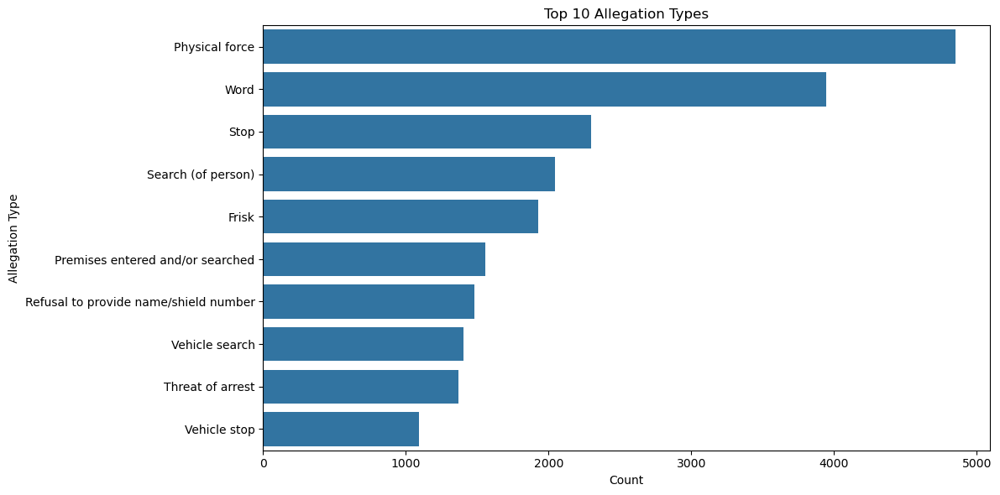

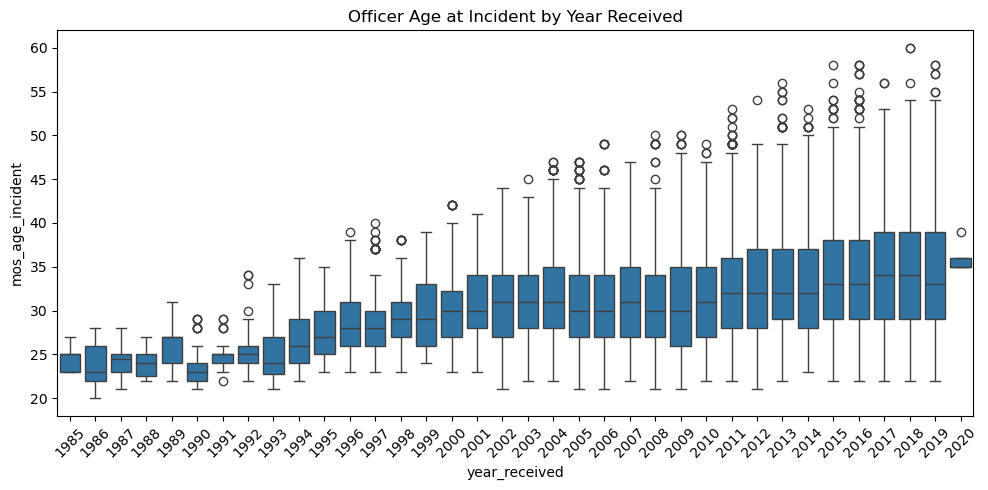

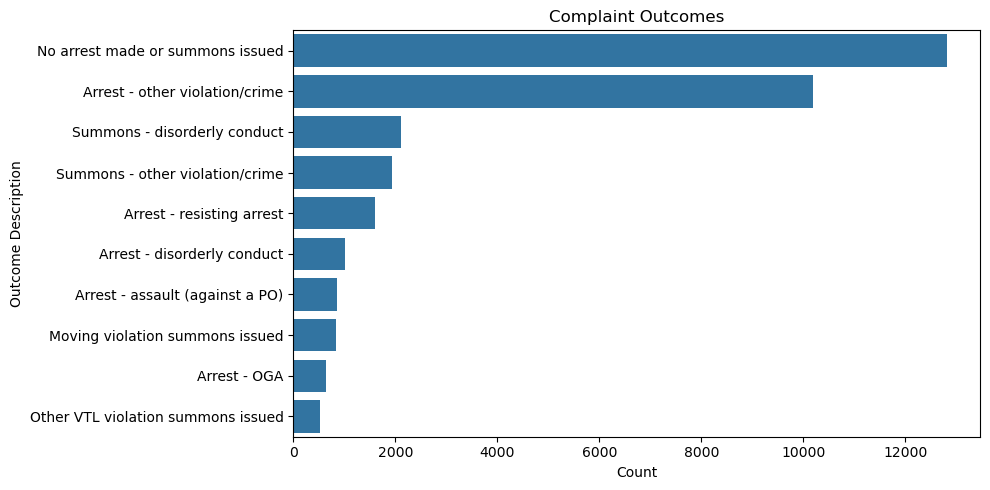

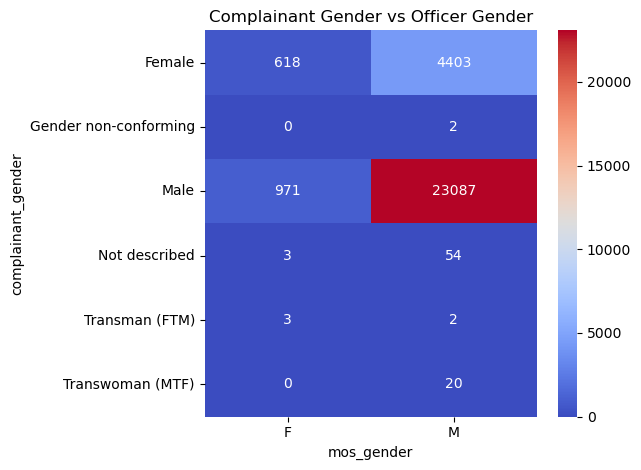

In [8]:
# COMPLAINTS DATASET

import matplotlib.pyplot as plt
import seaborn as sns

# Convert year/month to datetime for time-based plots
complaints['date_received'] = pd.to_datetime(
    complaints['year_received'].astype(str) + '-' + complaints['month_received'].astype(str),
    errors='coerce'
)
complaints['date_closed'] = pd.to_datetime(
    complaints['year_closed'].astype(str) + '-' + complaints['month_closed'].astype(str),
    errors='coerce'
)

# 1. Complaints Over Time
plt.figure(figsize=(10, 5))
complaints['date_received'].dt.to_period('M').value_counts().sort_index().plot(kind='line')
plt.title('Complaints Received Over Time')
plt.xlabel('Date')
plt.ylabel('Number of Complaints')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# 2. Top 10 Allegation Types
plt.figure(figsize=(12, 6))
sns.countplot(data=complaints, y='allegation', order=complaints['allegation'].value_counts().index[:10])
plt.title('Top 10 Allegation Types')
plt.xlabel('Count')
plt.ylabel('Allegation Type')
plt.tight_layout()
plt.show()

# 3. Officer Age at Incident vs. Year
plt.figure(figsize=(10, 5))
sns.boxplot(data=complaints, x='year_received', y='mos_age_incident')
plt.title('Officer Age at Incident by Year Received')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# 4. Outcome Descriptions
plt.figure(figsize=(10, 5))
sns.countplot(data=complaints, y='outcome_description', order=complaints['outcome_description'].value_counts().index[:10])
plt.title('Complaint Outcomes')
plt.xlabel('Count')
plt.ylabel('Outcome Description')
plt.tight_layout()
plt.show()

# 5. Complainant Gender vs Officer Gender
cross_tab = pd.crosstab(complaints['complainant_gender'], complaints['mos_gender'])
sns.heatmap(cross_tab, annot=True, fmt='d', cmap='coolwarm')
plt.title('Complainant Gender vs Officer Gender')
plt.tight_layout()
plt.show()


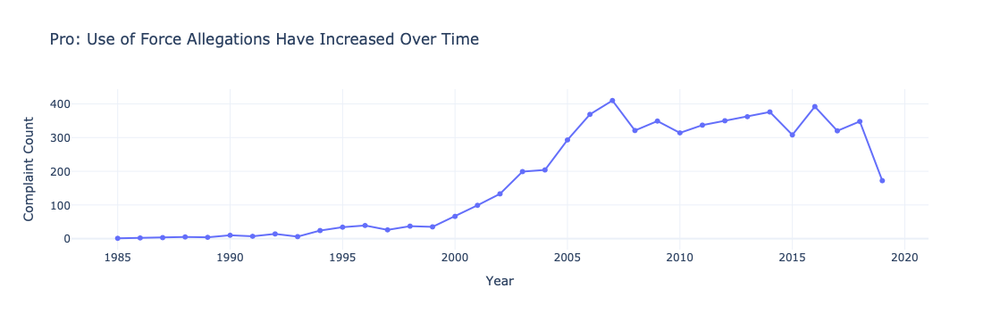

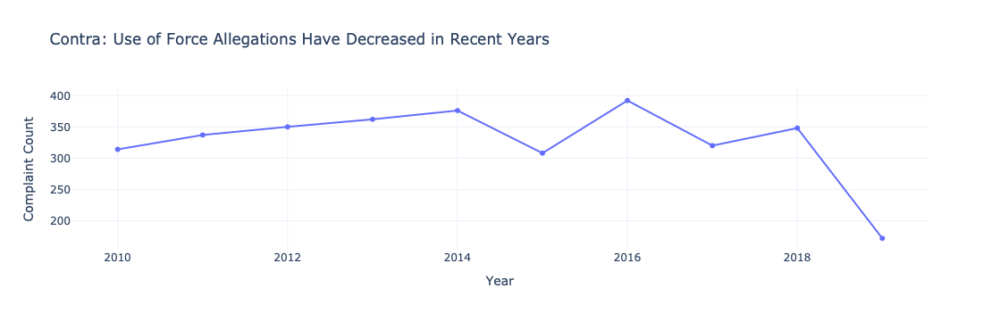

In [9]:
# Allegations of use of force have increased over time

use_of_force = complaints[complaints['allegation'].str.contains('force', case=False, na=False)]
force_counts = use_of_force['year_received'].value_counts().sort_index().reset_index()
force_counts.columns = ['Year', 'Complaint Count']

fig_pro1 = px.line(
    force_counts,
    x='Year',
    y='Complaint Count',
    markers=True,
    title='Pro: Use of Force Allegations Have Increased Over Time'
)
fig_pro1.update_layout(template='plotly_white')
fig_pro1.show()

# --- CONTRA-POSITION 1 ---
# Use of force allegations have decreased in recent years

recent_force_counts = force_counts[force_counts['Year'] >= 2010]

fig_contra1 = px.line(
    recent_force_counts,
    x='Year',
    y='Complaint Count',
    markers=True,
    title='Contra: Use of Force Allegations Have Decreased in Recent Years'
)
fig_contra1.update_layout(template='plotly_white')
fig_contra1.show()

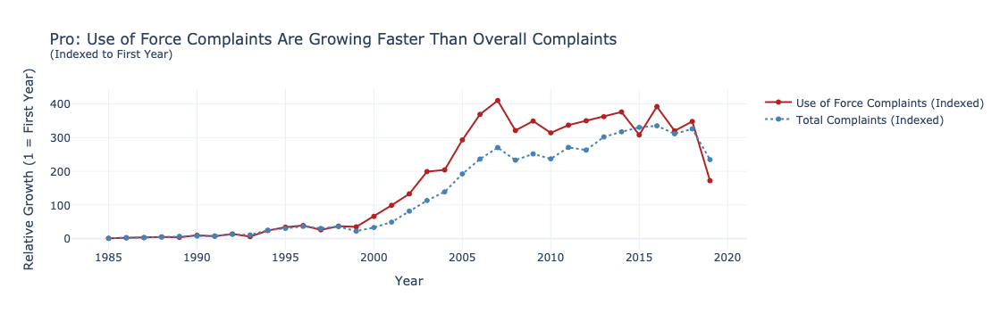

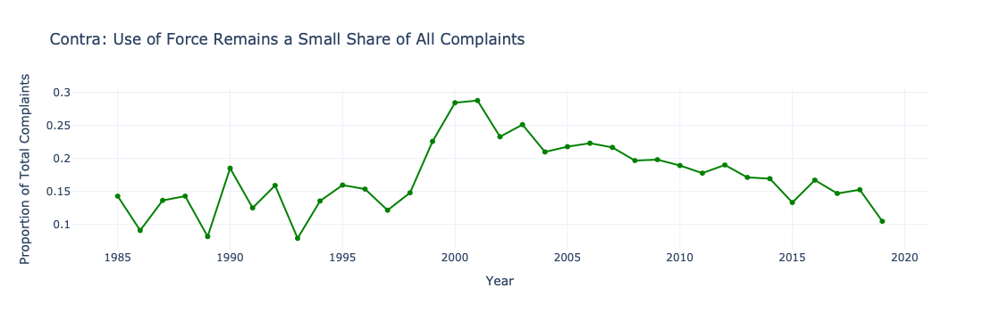

In [10]:
import plotly.graph_objects as go

# Total complaints per year
total_counts = complaints['year_received'].value_counts().sort_index().reset_index()
total_counts.columns = ['Year', 'Total Complaints']

# Use of force complaints per year
use_of_force = complaints[complaints['allegation'].str.contains('force', case=False, na=False)]
force_counts = use_of_force['year_received'].value_counts().sort_index().reset_index()
force_counts.columns = ['Year', 'Use of Force Complaints']

# Merge them
merged = pd.merge(force_counts, total_counts, on='Year', how='inner')
merged['Proportion Use of Force'] = merged['Use of Force Complaints'] / merged['Total Complaints']

# --- PRO: Use of Force is Growing Faster than Overall Complaints ---
# Normalize both series to their first year's value
merged_norm = merged.copy()
merged_norm['UseNorm'] = merged['Use of Force Complaints'] / merged['Use of Force Complaints'].iloc[0]
merged_norm['TotalNorm'] = merged['Total Complaints'] / merged['Total Complaints'].iloc[0]

fig_pro3 = go.Figure()

fig_pro3.add_trace(go.Scatter(
    x=merged_norm['Year'],
    y=merged_norm['UseNorm'],
    mode='lines+markers',
    name='Use of Force Complaints (Indexed)',
    line=dict(color='firebrick')
))

fig_pro3.add_trace(go.Scatter(
    x=merged_norm['Year'],
    y=merged_norm['TotalNorm'],
    mode='lines+markers',
    name='Total Complaints (Indexed)',
    line=dict(color='steelblue', dash='dot')
))

fig_pro3.update_layout(
    title='Pro: Use of Force Complaints Are Growing Faster Than Overall Complaints<br><sup>(Indexed to First Year)</sup>',
    xaxis_title='Year',
    yaxis_title='Relative Growth (1 = First Year)',
    template='plotly_white'
)
fig_pro3.show()

# --- CONTRA: Use of Force Is a Small, Steady Proportion of Total Complaints ---
fig_contra3 = go.Figure()

fig_contra3.add_trace(go.Scatter(
    x=merged['Year'],
    y=merged['Proportion Use of Force'],
    mode='lines+markers',
    name='Use of Force as % of Complaints',
    line=dict(color='green')
))

fig_contra3.update_layout(
    title='Contra: Use of Force Remains a Small Share of All Complaints',
    xaxis_title='Year',
    yaxis_title='Proportion of Total Complaints',
    template='plotly_white'
)
fig_contra3.show()


## Climate

In [15]:
print(climate.columns)
climate

Index(['Country Name', 'Country Code', 'Year',
       'average_value_Access to electricity (% of population)',
       'average_value_Agricultural land (% of land area)',
       'average_value_Agricultural land (sq. km)',
       'average_value_Agriculture, forestry, and fishing, value added (% of GDP)',
       'average_value_Annual freshwater withdrawals, total (% of internal resources)',
       'average_value_Annual freshwater withdrawals, total (billion cubic meters)',
       'average_value_Arable land (% of land area)',
       'average_value_CO2 emissions (kg per 2010 US$ of GDP)',
       'average_value_CO2 emissions (kg per 2017 PPP $ of GDP)',
       'average_value_CO2 emissions (kt)',
       'average_value_CO2 emissions (metric tons per capita)',
       'average_value_CO2 emissions from gaseous fuel consumption (% of total)',
       'average_value_CO2 emissions from gaseous fuel consumption (kt)',
       'average_value_CO2 emissions from liquid fuel consumption (% of total)',
    

,Country Name,Country Code,Year,average_value_Access to electricity (% of population),average_value_Agricultural land (% of land area),average_value_Agricultural land (sq. km),"average_value_Agriculture, forestry, and fishing, value added (% of GDP)","average_value_Annual freshwater withdrawals, total (% of internal resources)","average_value_Annual freshwater withdrawals, total (billion cubic meters)",average_value_Arable land (% of land area),...,"average_value_School enrollment, primary and secondary (gross), gender parity index (GPI)",average_value_Terrestrial and marine protected areas (% of total territorial area),average_value_Terrestrial protected areas (% of total land area),average_value_Total greenhouse gas emissions (kt of CO2 equivalent),average_value_Urban land area where elevation is below 5 meters (% of total land area),average_value_Urban land area where elevation is below 5 meters (sq. km),average_value_Urban population,average_value_Urban population (% of total population),average_value_Urban population growth (annual %),average_value_Urban population living in areas where elevation is below 5 meters (% of total population)
0,Africa Eastern and Southern,AFE,1987,NaN,44.513309,5428670.0,15.468203,NaN,NaN,5.748789,...,NaN,NaN,NaN,1.928434e+06,NaN,NaN,65511328.0,23.465243,5.030075,NaN
1,Albania,ALB,1977,NaN,40.474453,11090.0,NaN,NaN,NaN,21.167883,...,NaN,NaN,NaN,8.948981e+03,NaN,NaN,832109.0,33.105000,2.810025,NaN
2,Albania,ALB,2019,100.000000,NaN,NaN,18.463380,NaN,NaN,NaN,...,1.01863,NaN,NaN,NaN,NaN,NaN,1747593.0,61.229000,1.071414,NaN
3,Armenia,ARM,2020,NaN,NaN,NaN,11.717313,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,1876112.0,63.313000,0.334548,NaN
4,Azerbaijan,AZE,2013,100.000000,57.704545,47698.0,5.366264,NaN,NaN,23.292080,...,NaN,NaN,NaN,8.303000e+04,NaN,NaN,5098727.0,54.145000,1.778515,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16160,Uzbekistan,UZB,1978,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,7.904405e+04,NaN,NaN,6103597.0,40.536000,3.987221,NaN
16161,Vanuatu,VUT,1976,NaN,10.336341,1260.0,NaN,NaN,NaN,1.312551,...,0.89463,NaN,NaN,3.070140e+02,NaN,NaN,14028.0,13.619000,4.751852,NaN
16162,"Yemen, Rep.",YEM,1963,NaN,44.244938,233600.0,NaN,NaN,NaN,2.433850,...,NaN,NaN,NaN,NaN,NaN,NaN,567679.0,10.216000,5.348011,NaN
16163,South Africa,ZAF,1969,NaN,78.963638,957900.0,7.817454,NaN,NaN,10.164126,...,NaN,NaN,NaN,NaN,NaN,NaN,10254488.0,47.704000,2.849924,NaN


In [17]:
climate[climate["Country Name"] == "India"]

,Country Name,Country Code,Year,average_value_Access to electricity (% of population),average_value_Agricultural land (% of land area),average_value_Agricultural land (sq. km),"average_value_Agriculture, forestry, and fishing, value added (% of GDP)","average_value_Annual freshwater withdrawals, total (% of internal resources)","average_value_Annual freshwater withdrawals, total (billion cubic meters)",average_value_Arable land (% of land area),...,"average_value_School enrollment, primary and secondary (gross), gender parity index (GPI)",average_value_Terrestrial and marine protected areas (% of total territorial area),average_value_Terrestrial protected areas (% of total land area),average_value_Total greenhouse gas emissions (kt of CO2 equivalent),average_value_Urban land area where elevation is below 5 meters (% of total land area),average_value_Urban land area where elevation is below 5 meters (sq. km),average_value_Urban population,average_value_Urban population (% of total population),average_value_Urban population growth (annual %),average_value_Urban population living in areas where elevation is below 5 meters (% of total population)
36,India,IND,2005,67.093437,60.583414,1801260.0,17.620207,NaN,NaN,53.627249,...,NaN,NaN,NaN,1969680.00,NaN,NaN,335503761.0,29.235,2.721832,NaN
117,India,IND,1980,NaN,60.632519,1802720.0,33.057485,NaN,NaN,54.774165,...,0.61098,NaN,NaN,929414.77,NaN,NaN,161444126.0,23.098,3.889168,NaN
546,India,IND,1994,49.811310,60.975249,1812910.0,26.388619,NaN,NaN,54.663510,...,0.75322,NaN,NaN,1391780.00,NaN,NaN,249629427.0,26.399,2.734273,NaN
850,India,IND,2009,75.000000,60.563906,1800680.0,16.744270,NaN,NaN,53.116013,...,0.98997,NaN,NaN,2452660.00,NaN,NaN,372465918.0,30.587,2.531697,NaN
1006,India,IND,2008,71.651085,60.459305,1797570.0,16.790942,NaN,NaN,53.139894,...,0.96705,NaN,NaN,2309340.00,NaN,NaN,363154576.0,30.246,2.595371,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15461,India,IND,1960,NaN,NaN,NaN,41.312839,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,80756165.0,17.924,NaN,NaN
15462,India,IND,1972,NaN,59.850195,1779460.0,38.017722,NaN,NaN,53.876812,...,0.58250,NaN,NaN,767242.36,NaN,NaN,118082741.0,20.321,3.938455,NaN
15463,India,IND,1991,NaN,61.074469,1815860.0,27.333218,NaN,NaN,54.884484,...,NaN,NaN,NaN,1281480.00,NaN,NaN,229752406.0,25.778,2.939881,NaN
15949,India,IND,1986,NaN,60.941951,1811920.0,27.468761,NaN,NaN,54.960833,...,0.65795,NaN,NaN,1199500.61,NaN,NaN,197165615.0,24.585,3.189642,NaN


/var/folders/vn/xnxk6ztx36qf8mb5zzjwrrs40000gp/T/ipykernel_4898/3858640359.py:10: FutureWarning:



The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.




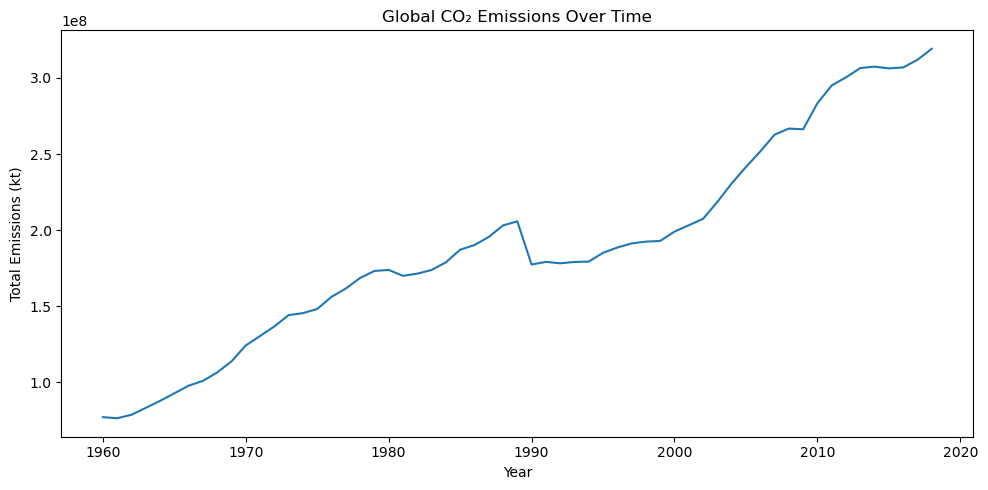

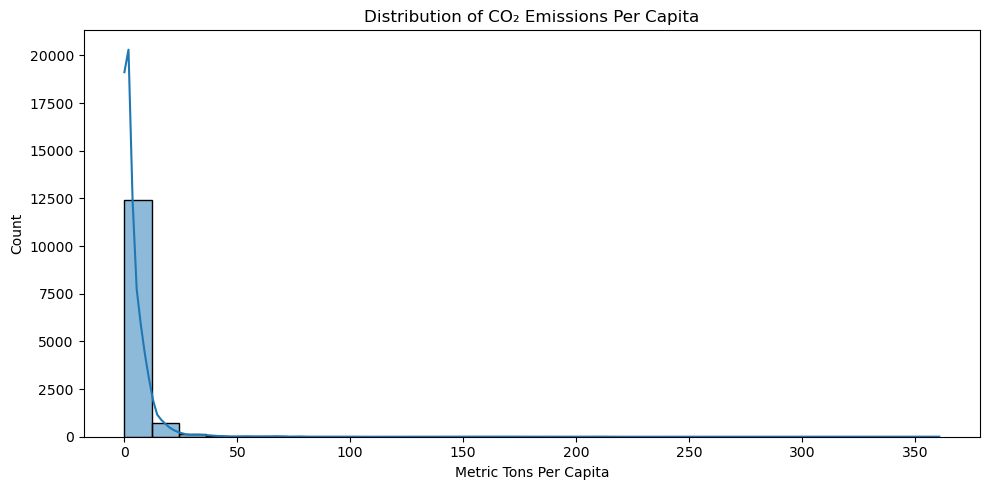

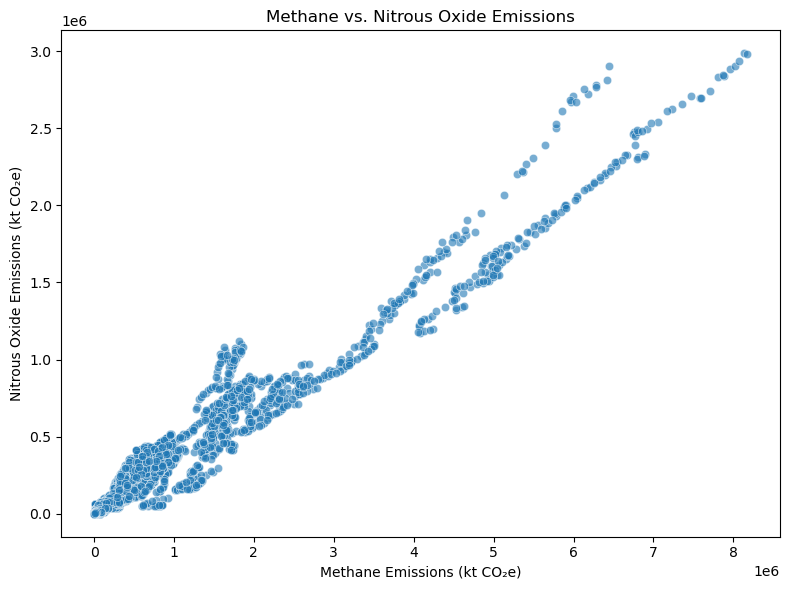

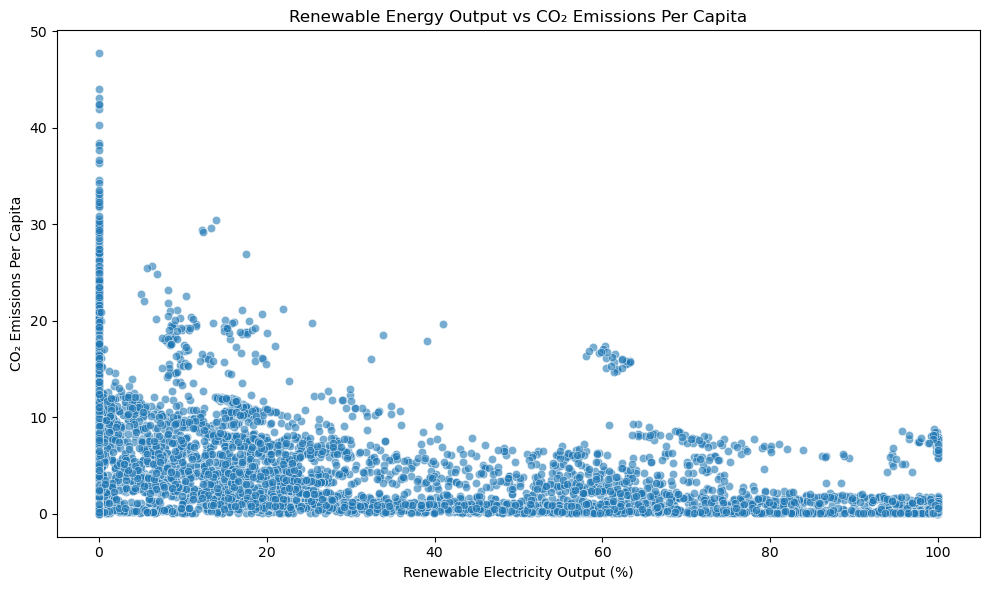

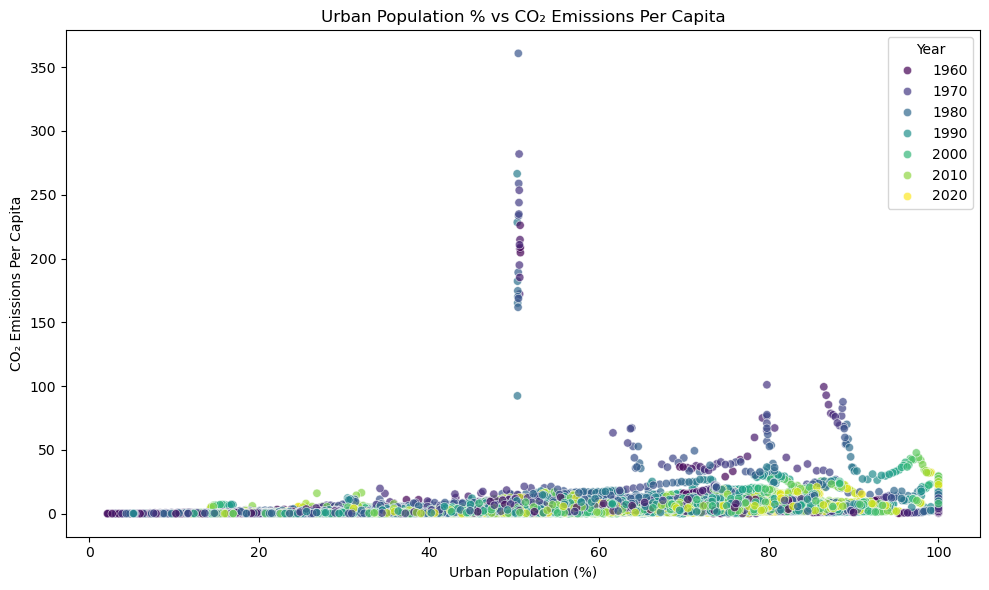

In [19]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Convert 'Year' to numeric (if it's not already)
climate['Year'] = pd.to_numeric(climate['Year'], errors='coerce')

# 1. CO₂ Emissions Over Time (Total)
plt.figure(figsize=(10, 5))
sns.lineplot(data=climate, x='Year', y='average_value_CO2 emissions (kt)', estimator='sum', ci=None)
plt.title('Global CO₂ Emissions Over Time')
plt.ylabel('Total Emissions (kt)')
plt.xlabel('Year')
plt.tight_layout()
plt.show()

# 2. CO₂ Emissions Per Capita (Histogram)
plt.figure(figsize=(10, 5))
sns.histplot(climate['average_value_CO2 emissions (metric tons per capita)'].dropna(), bins=30, kde=True)
plt.title('Distribution of CO₂ Emissions Per Capita')
plt.xlabel('Metric Tons Per Capita')
plt.tight_layout()
plt.show()

# 3. Methane vs. Nitrous Oxide Emissions
plt.figure(figsize=(8, 6))
sns.scatterplot(
    data=climate,
    x='average_value_Methane emissions (kt of CO2 equivalent)',
    y='average_value_Nitrous oxide emissions (thousand metric tons of CO2 equivalent)',
    alpha=0.6
)
plt.title('Methane vs. Nitrous Oxide Emissions')
plt.xlabel('Methane Emissions (kt CO₂e)')
plt.ylabel('Nitrous Oxide Emissions (kt CO₂e)')
plt.tight_layout()
plt.show()

# 4. Renewable Energy Use vs CO₂ Emissions
plt.figure(figsize=(10, 6))
sns.scatterplot(
    data=climate,
    x='average_value_Renewable electricity output (% of total electricity output)',
    y='average_value_CO2 emissions (metric tons per capita)',
    alpha=0.6
)
plt.title('Renewable Energy Output vs CO₂ Emissions Per Capita')
plt.xlabel('Renewable Electricity Output (%)')
plt.ylabel('CO₂ Emissions Per Capita')
plt.tight_layout()
plt.show()

# 5. Urbanization vs Emissions
plt.figure(figsize=(10, 6))
sns.scatterplot(
    data=climate,
    x='average_value_Urban population (% of total population)',
    y='average_value_CO2 emissions (metric tons per capita)',
    hue='Year',
    palette='viridis',
    alpha=0.7
)
plt.title('Urban Population % vs CO₂ Emissions Per Capita')
plt.xlabel('Urban Population (%)')
plt.ylabel('CO₂ Emissions Per Capita')
plt.tight_layout()
plt.show()


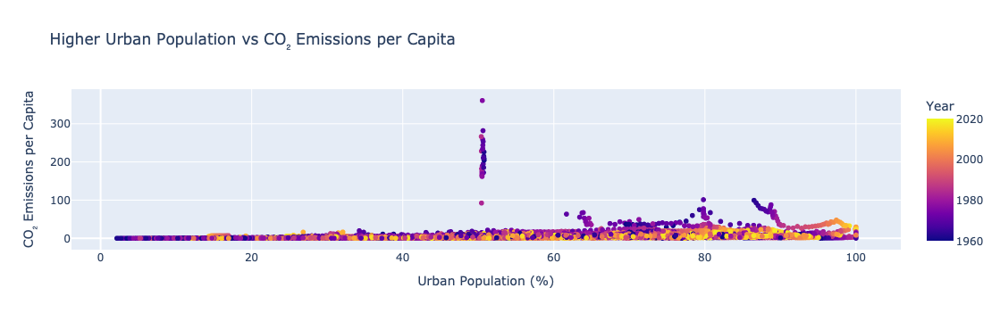

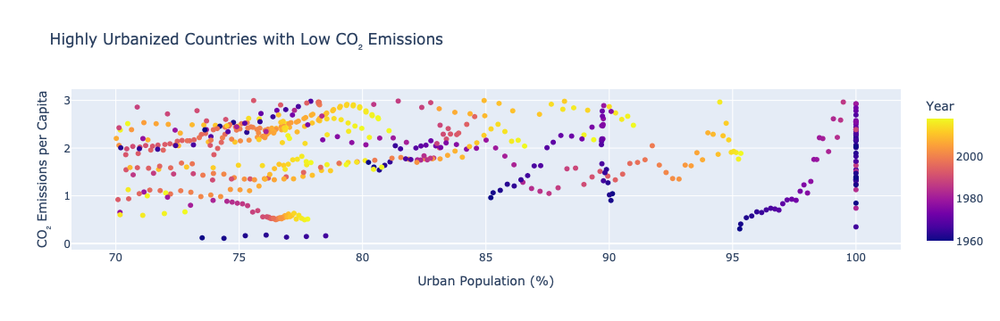

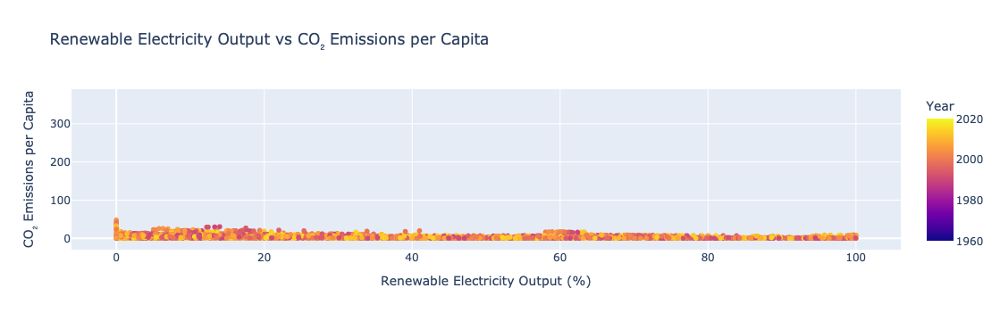

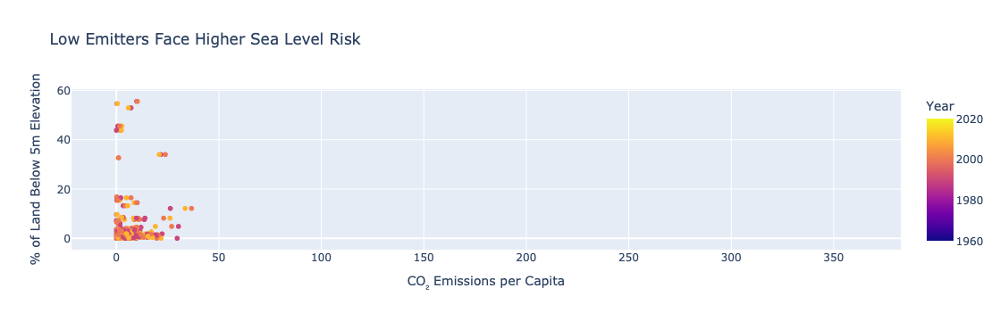

In [20]:
import pandas as pd
import plotly.express as px

# 1. Pro-position: Higher Urban Population → Higher CO₂ Emissions
fig1 = px.scatter(
    climate,
    x='average_value_Urban population (% of total population)',
    y='average_value_CO2 emissions (metric tons per capita)',
    color='Year',
    hover_name='Country Name',
    title='Higher Urban Population vs CO₂ Emissions per Capita',
    labels={
        'average_value_Urban population (% of total population)': 'Urban Population (%)',
        'average_value_CO2 emissions (metric tons per capita)': 'CO₂ Emissions per Capita'
    }
)
fig1.show()

# 2. Contra-position: High Urbanization but Low Emissions
filtered_climate = climate[
    (climate['average_value_Urban population (% of total population)'] > 70) &
    (climate['average_value_CO2 emissions (metric tons per capita)'] < 3)
]

fig2 = px.scatter(
    filtered_climate,
    x='average_value_Urban population (% of total population)',
    y='average_value_CO2 emissions (metric tons per capita)',
    hover_name='Country Name',
    color='Year',
    title='Highly Urbanized Countries with Low CO₂ Emissions',
    labels={
        'average_value_Urban population (% of total population)': 'Urban Population (%)',
        'average_value_CO2 emissions (metric tons per capita)': 'CO₂ Emissions per Capita'
    }
)
fig2.show()

# 3. Alternative angle: Renewable Energy Output vs CO₂ Emissions
fig3 = px.scatter(
    climate,
    x='average_value_Renewable electricity output (% of total electricity output)',
    y='average_value_CO2 emissions (metric tons per capita)',
    color='Year',
    hover_name='Country Name',
    title='Renewable Electricity Output vs CO₂ Emissions per Capita',
    labels={
        'average_value_Renewable electricity output (% of total electricity output)': 'Renewable Electricity Output (%)',
        'average_value_CO2 emissions (metric tons per capita)': 'CO₂ Emissions per Capita'
    }
)
fig3.show()

# 4. Climate Justice Angle: Low CO₂ Emitters & Sea Level Vulnerability
fig4 = px.scatter(
    climate,
    x='average_value_CO2 emissions (metric tons per capita)',
    y='average_value_Land area where elevation is below 5 meters (% of total land area)',
    hover_name='Country Name',
    color='Year',
    title='Low Emitters Face Higher Sea Level Risk',
    labels={
        'average_value_CO2 emissions (metric tons per capita)': 'CO₂ Emissions per Capita',
        'average_value_Land area where elevation is below 5 meters (% of total land area)': '% of Land Below 5m Elevation'
    }
)
fig4.show()


In [21]:
# Ensure 'Year' is numeric
climate['Year'] = pd.to_numeric(climate['Year'], errors='coerce')

# Drop rows where 'Year' is missing
climate_cleaned = climate.dropna(subset=['Year', 'average_value_Urban population (% of total population)', 'average_value_CO2 emissions (metric tons per capita)'])

# Keep the most recent year for each country
climate_latest = climate_cleaned.sort_values('Year', ascending=False).drop_duplicates(subset='Country Name', keep='first')

# Optional: sort alphabetically by country name
climate_latest = climate_latest.sort_values('Country Name').reset_index(drop=True)

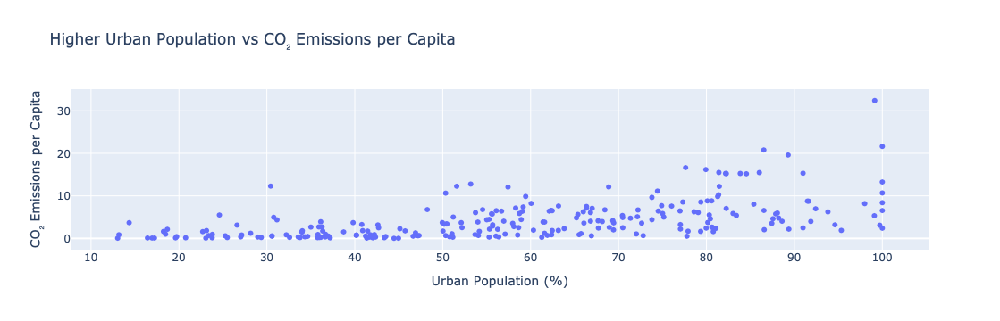

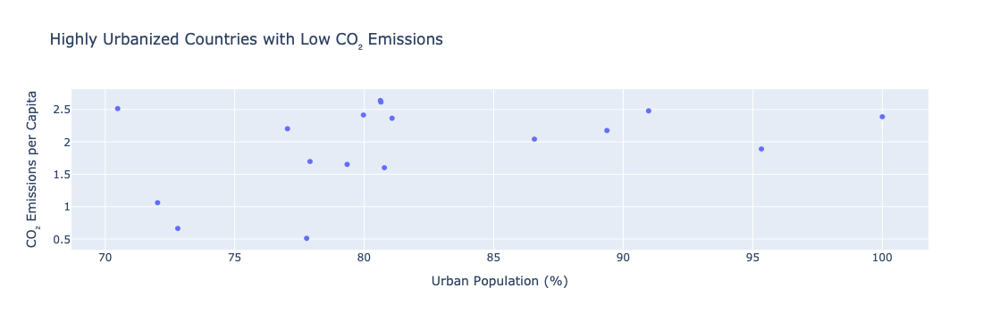

In [23]:
# 1. Pro-position: Higher Urban Population → Higher CO₂ Emissions
fig1 = px.scatter(
    climate_latest,
    x='average_value_Urban population (% of total population)',
    y='average_value_CO2 emissions (metric tons per capita)',
    hover_name='Country Name',
    title='Higher Urban Population vs CO₂ Emissions per Capita',
    labels={
        'average_value_Urban population (% of total population)': 'Urban Population (%)',
        'average_value_CO2 emissions (metric tons per capita)': 'CO₂ Emissions per Capita'
    }
)
fig1.show()

# 2. Contra-position: High Urbanization but Low Emissions
filtered_climate = climate_latest[
    (climate_latest['average_value_Urban population (% of total population)'] > 70) &
    (climate_latest['average_value_CO2 emissions (metric tons per capita)'] < 3)
]

fig2 = px.scatter(
    filtered_climate,
    x='average_value_Urban population (% of total population)',
    y='average_value_CO2 emissions (metric tons per capita)',
    hover_name='Country Name',
    title='Highly Urbanized Countries with Low CO₂ Emissions',
    labels={
        'average_value_Urban population (% of total population)': 'Urban Population (%)',
        'average_value_CO2 emissions (metric tons per capita)': 'CO₂ Emissions per Capita'
    }
)
fig2.show()

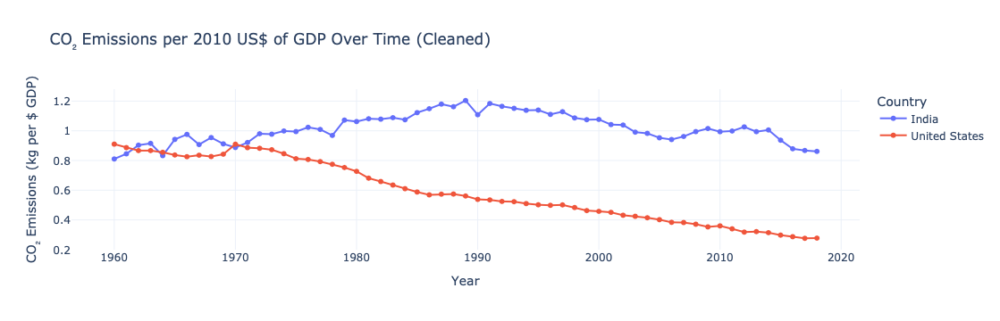

In [27]:
import pandas as pd
import plotly.express as px

# Choose countries
country_1 = "United States"
country_2 = "India"

# Filter rows for selected countries and non-missing years and values
subset = climate[
    (climate['Country Name'].isin([country_1, country_2])) &
    (climate['average_value_CO2 emissions (kg per 2010 US$ of GDP)'].notna()) &
    (climate['Year'].notna())
].copy()

# Ensure Year is numeric
subset['Year'] = pd.to_numeric(subset['Year'], errors='coerce')

# Group by country and year, take average if duplicates exist
grouped = subset.groupby(['Country Name', 'Year'])[
    'average_value_CO2 emissions (kg per 2010 US$ of GDP)'
].mean().reset_index()

# Sort for proper line connection
grouped = grouped.sort_values(by=['Country Name', 'Year'])

# Plot clean line chart
fig = px.line(
    grouped,
    x='Year',
    y='average_value_CO2 emissions (kg per 2010 US$ of GDP)',
    color='Country Name',
    markers=True,
    title='CO₂ Emissions per 2010 US$ of GDP Over Time (Cleaned)',
    labels={
        'average_value_CO2 emissions (kg per 2010 US$ of GDP)': 'CO₂ Emissions (kg per $ GDP)',
        'Country Name': 'Country'
    }
)
fig.update_layout(template='plotly_white')
fig.show()


# “Despite economic growth, India has not meaningfully improved its emissions efficiency in recent decades.”

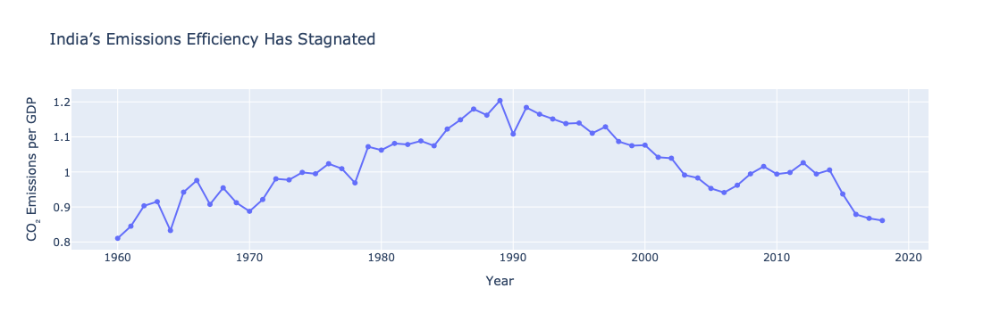

In [31]:
# Filter for India and valid data
india = climate[
    (climate['Country Name'] == 'India') &
    (climate['average_value_CO2 emissions (kg per 2010 US$ of GDP)'].notna())
].copy()

india['Year'] = pd.to_numeric(india['Year'], errors='coerce')
india = india.groupby('Year')['average_value_CO2 emissions (kg per 2010 US$ of GDP)'].mean().reset_index()

# Line chart: emissions efficiency flat
import plotly.express as px
fig1 = px.line(
    india,
    x='Year',
    y='average_value_CO2 emissions (kg per 2010 US$ of GDP)',
    title='India’s Emissions Efficiency Has Stagnated',
    labels={'average_value_CO2 emissions (kg per 2010 US$ of GDP)': 'CO₂ Emissions per GDP'}
)
fig1.update_traces(mode='lines+markers')
fig1.show()

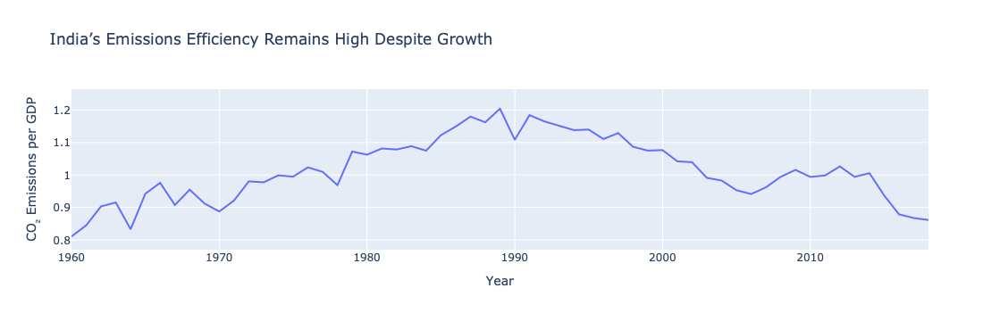

In [33]:
# Same data, but truncate y-axis for exaggeration
fig2 = px.line(
    india,
    x='Year',
    y='average_value_CO2 emissions (kg per 2010 US$ of GDP)',
    title='India’s Emissions Efficiency Remains High Despite Growth',
    labels={'average_value_CO2 emissions (kg per 2010 US$ of GDP)': 'CO₂ Emissions per GDP'}
)

fig2.update_layout(
    yaxis_range=[min(india['average_value_CO2 emissions (kg per 2010 US$ of GDP)']) * 0.95,
                 max(india['average_value_CO2 emissions (kg per 2010 US$ of GDP)']) * 1.05],
    xaxis_title='Year',
    yaxis_title='CO₂ Emissions per GDP'
)
fig2.show()


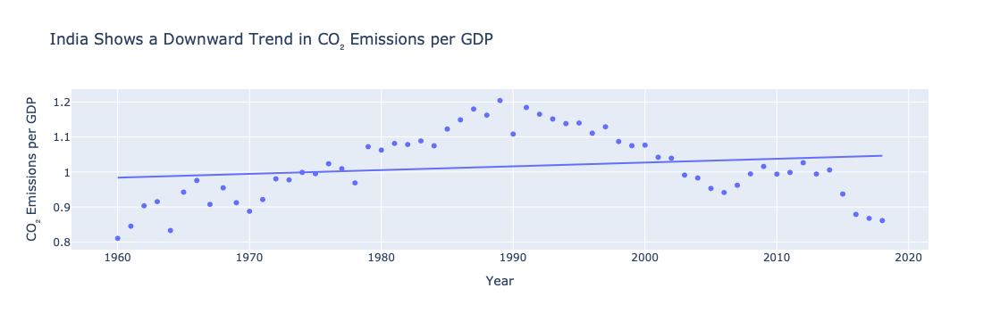

In [35]:
fig3 = px.scatter(
    india,
    x='Year',
    y='average_value_CO2 emissions (kg per 2010 US$ of GDP)',
    trendline='ols',
    title='India Shows a Downward Trend in CO₂ Emissions per GDP',
    labels={'average_value_CO2 emissions (kg per 2010 US$ of GDP)': 'CO₂ Emissions per GDP'}
)
fig3.update_traces(marker=dict(size=6))
fig3.show()


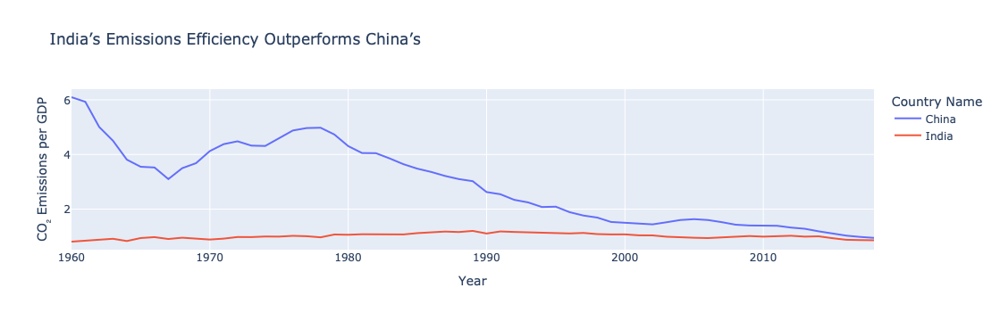

In [37]:
# Filter both countries
compare = climate[
    (climate['Country Name'].isin(['India', 'China'])) &
    (climate['average_value_CO2 emissions (kg per 2010 US$ of GDP)'].notna())
].copy()

compare['Year'] = pd.to_numeric(compare['Year'], errors='coerce')
compare = (
    compare.dropna(subset=['Year'])
    .groupby(['Country Name', 'Year'])['average_value_CO2 emissions (kg per 2010 US$ of GDP)']
    .mean()
    .reset_index()
    .sort_values(['Country Name', 'Year'])
)

fig4 = px.line(
    compare,
    x='Year',
    y='average_value_CO2 emissions (kg per 2010 US$ of GDP)',
    color='Country Name',
    title='India’s Emissions Efficiency Outperforms China’s',
    labels={'average_value_CO2 emissions (kg per 2010 US$ of GDP)': 'CO₂ Emissions per GDP'}
)
fig4.update_layout(yaxis_title='CO₂ Emissions per GDP', xaxis_title='Year')
fig4.show()


# India has failed to balance growth with climate responsibility

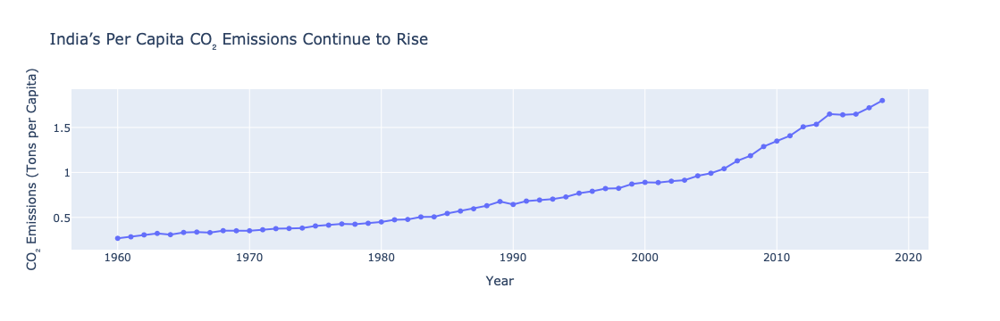

In [40]:
# Total CO2 emissions over time for India
india_total = climate[
    (climate['Country Name'] == 'India') &
    (climate['average_value_CO2 emissions (metric tons per capita)'].notna())
].copy()

india_total['Year'] = pd.to_numeric(india_total['Year'], errors='coerce')
india_total = india_total.groupby('Year')['average_value_CO2 emissions (metric tons per capita)'].mean().reset_index()

import plotly.express as px
fig1 = px.line(
    india_total,
    x='Year',
    y='average_value_CO2 emissions (metric tons per capita)',
    title='India’s Per Capita CO₂ Emissions Continue to Rise',
    labels={'average_value_CO2 emissions (metric tons per capita)': 'CO₂ Emissions (Tons per Capita)'}
)
fig1.update_traces(mode='lines+markers')
fig1.show()


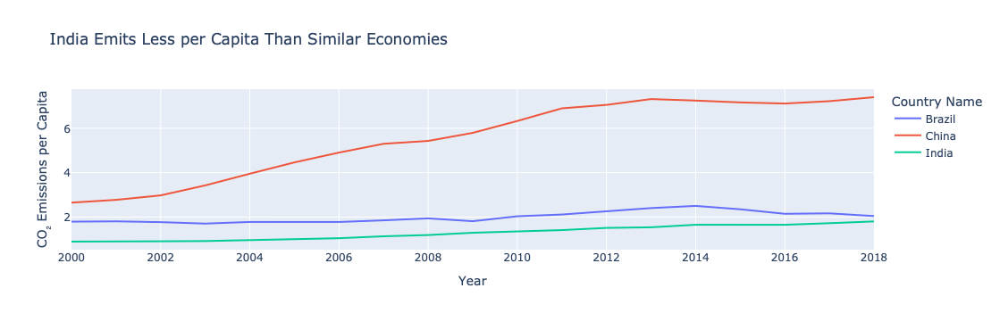

In [42]:
compare_b = climate[
    (climate['Country Name'].isin(['India', 'China', 'Brazil'])) &
    (climate['average_value_CO2 emissions (metric tons per capita)'].notna())
].copy()

compare_b['Year'] = pd.to_numeric(compare_b['Year'], errors='coerce')
compare_b = (
    compare_b.dropna(subset=['Year'])
    .groupby(['Country Name', 'Year'])['average_value_CO2 emissions (metric tons per capita)']
    .mean()
    .reset_index()
    .sort_values(['Country Name', 'Year'])
)

fig4 = px.line(
    compare_b[compare_b['Year'] >= 2000],
    x='Year',
    y='average_value_CO2 emissions (metric tons per capita)',
    color='Country Name',
    title='India Emits Less per Capita Than Similar Economies',
    labels={'average_value_CO2 emissions (metric tons per capita)': 'CO₂ Emissions per Capita'}
)
fig4.show()


"India has failed to balance economic growth with climate responsibility."

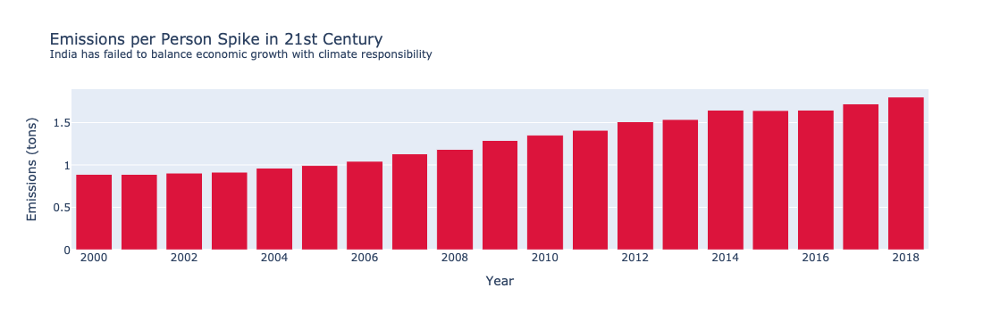

In [45]:
# Convert line to bar and limit years
subset = india_total[(india_total['Year'] >= 2000) & (india_total['Year'] <= 2020)]
fig2 = px.bar(
    subset,
    x='Year',
    y='average_value_CO2 emissions (metric tons per capita)',
    title='Emissions per Person Spike in 21st Century<br><sup>India has failed to balance economic growth with climate responsibility</sup>',
    labels={'average_value_CO2 emissions (metric tons per capita)': 'CO₂ per Capita'}
)
# Use alarming red hues
fig2.update_traces(marker_color='crimson')
fig2.update_layout(yaxis_title='Emissions (tons)', xaxis_title='Year')
fig2.show()

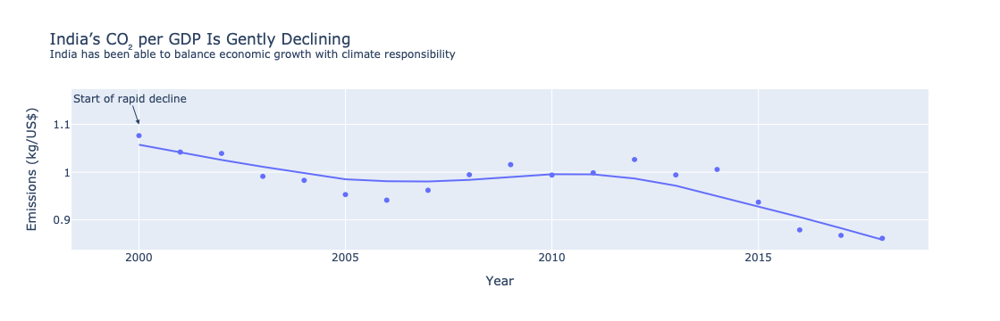

In [47]:
india_gdp = climate[
    (climate['Country Name'] == 'India') &
    (climate['average_value_CO2 emissions (kg per 2010 US$ of GDP)'].notna()) &
    (climate['Year'] >= 2000)
].copy()

fig3 = px.scatter(
    india_gdp,
    x='Year',
    y='average_value_CO2 emissions (kg per 2010 US$ of GDP)',
    trendline='lowess',
    title='India’s CO₂ per GDP Is Gently Declining<br><sup>India has been able to balance economic growth with climate responsibility</sup>',
    labels={'average_value_CO2 emissions (kg per 2010 US$ of GDP)': 'CO₂ per GDP'}
)
fig3.update_layout(xaxis_title='Year', yaxis_title='Emissions (kg/US$)')
fig3.update_layout(
    xaxis_title='Year',
    yaxis_title='Emissions (kg/US$)'
)

fig3.add_annotation(
    x=2000, y=1.1,
    text="Start of rapid decline",
    showarrow=True,
    arrowhead=2
)
fig3.update_layout(
    autosize=True
)

fig3.show()


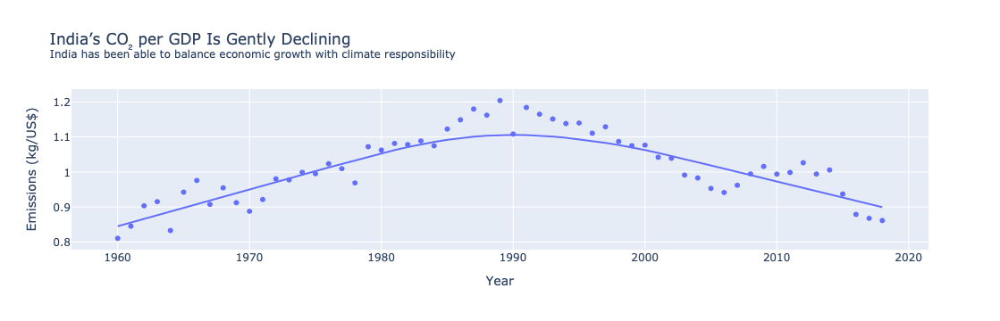

In [49]:
india_gdp = climate[
    (climate['Country Name'] == 'India') &
    (climate['average_value_CO2 emissions (kg per 2010 US$ of GDP)'].notna())
].copy()

fig3 = px.scatter(
    india_gdp,
    x='Year',
    y='average_value_CO2 emissions (kg per 2010 US$ of GDP)',
    trendline='lowess',
    title='India’s CO₂ per GDP Is Gently Declining<br><sup>India has been able to balance economic growth with climate responsibility</sup>',
    labels={'average_value_CO2 emissions (kg per 2010 US$ of GDP)': 'CO₂ per GDP'}
)
fig3.update_layout(xaxis_title='Year', yaxis_title='Emissions (kg/US$)')
fig3.show()


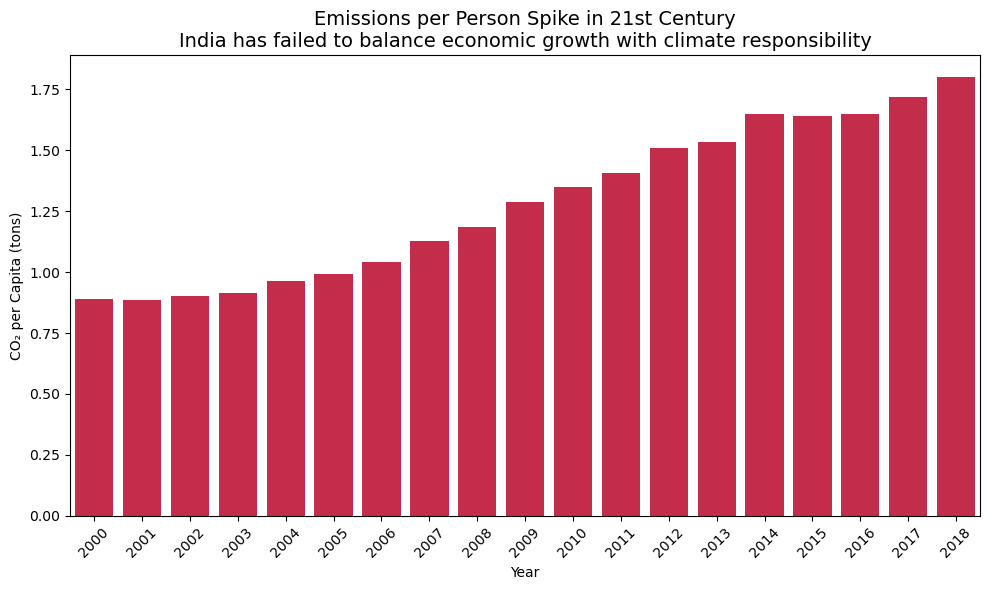

In [51]:
import seaborn as sns
import matplotlib.pyplot as plt

# Subset the data
subset = india_total[(india_total['Year'] >= 2000) & (india_total['Year'] <= 2020)]

# Set figure size
plt.figure(figsize=(10, 6))

# Create barplot
sns.barplot(data=subset, x='Year', y='average_value_CO2 emissions (metric tons per capita)', color='crimson')

# Titles and labels
plt.title('Emissions per Person Spike in 21st Century\nIndia has failed to balance economic growth with climate responsibility', fontsize=14)
plt.xlabel('Year')
plt.ylabel('CO₂ per Capita (tons)')

# Rotate x-axis labels if needed
plt.xticks(rotation=45)
plt.tight_layout()

# Show plot
plt.show()


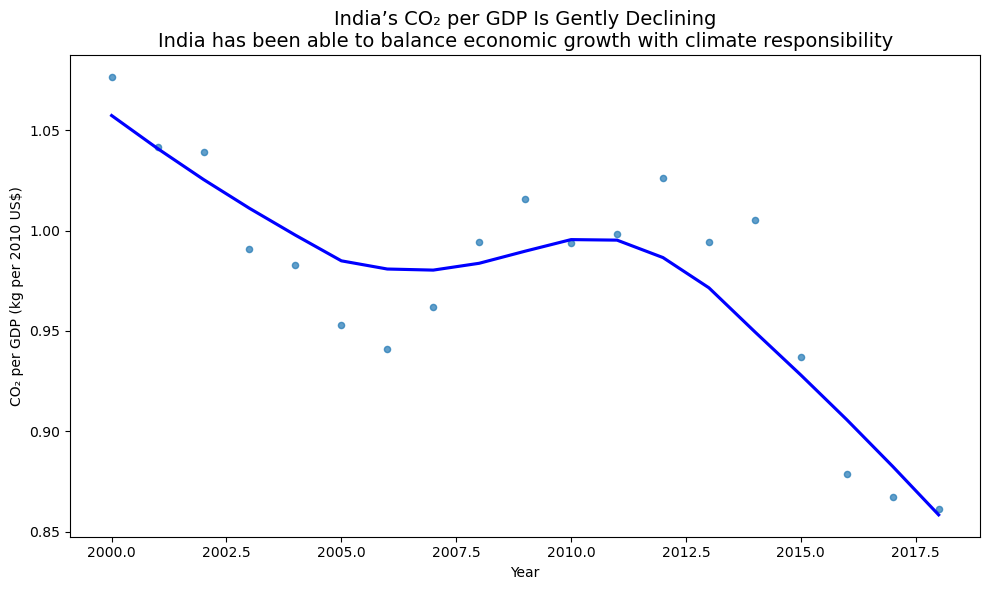

In [53]:
import seaborn as sns
import matplotlib.pyplot as plt

# Filter data from 2000 onwards
india_gdp_recent = india_gdp[india_gdp['Year'] >= 2000]

plt.figure(figsize=(10, 6))

sns.regplot(
    data=india_gdp_recent,
    x='Year',
    y='average_value_CO2 emissions (kg per 2010 US$ of GDP)',
    lowess=True,
    scatter_kws={'s': 20, 'alpha': 0.7},
    line_kws={'color': 'blue'}
)

plt.title('India’s CO₂ per GDP Is Gently Declining\nIndia has been able to balance economic growth with climate responsibility', fontsize=14)
plt.xlabel('Year')
plt.ylabel('CO₂ per GDP (kg per 2010 US$)')

plt.tight_layout()
plt.show()


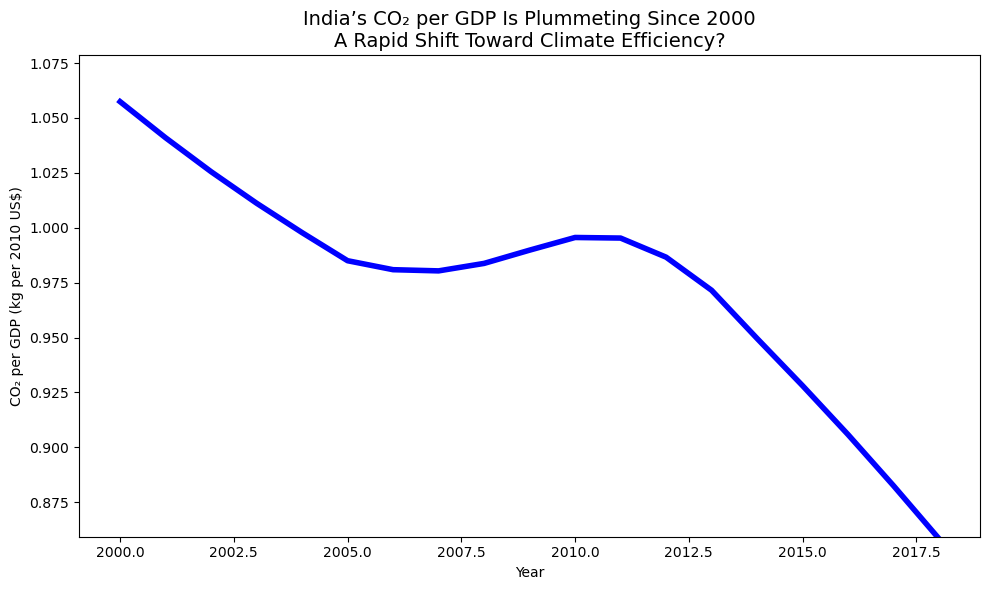

In [55]:
plt.figure(figsize=(10, 6))

sns.regplot(
    data=india_gdp_recent,
    x='Year',
    y='average_value_CO2 emissions (kg per 2010 US$ of GDP)',
    lowess=True,
    scatter=False,
    line_kws={'color': 'blue', 'linewidth': 4}
)

plt.title("India’s CO₂ per GDP Is Plummeting Since 2000\nA Rapid Shift Toward Climate Efficiency?", fontsize=14)
plt.xlabel('Year')
plt.ylabel('CO₂ per GDP (kg per 2010 US$)')

# Artificially tighten y-axis to exaggerate drop
ymin = india_gdp_recent['average_value_CO2 emissions (kg per 2010 US$ of GDP)'].min()
ymax = india_gdp_recent['average_value_CO2 emissions (kg per 2010 US$ of GDP)'].max()
plt.ylim(ymin - 0.002, ymax + 0.002)

plt.tight_layout()
plt.show()


In [57]:
climate.head()

,Country Name,Country Code,Year,average_value_Access to electricity (% of population),average_value_Agricultural land (% of land area),average_value_Agricultural land (sq. km),"average_value_Agriculture, forestry, and fishing, value added (% of GDP)","average_value_Annual freshwater withdrawals, total (% of internal resources)","average_value_Annual freshwater withdrawals, total (billion cubic meters)",average_value_Arable land (% of land area),...,"average_value_School enrollment, primary and secondary (gross), gender parity index (GPI)",average_value_Terrestrial and marine protected areas (% of total territorial area),average_value_Terrestrial protected areas (% of total land area),average_value_Total greenhouse gas emissions (kt of CO2 equivalent),average_value_Urban land area where elevation is below 5 meters (% of total land area),average_value_Urban land area where elevation is below 5 meters (sq. km),average_value_Urban population,average_value_Urban population (% of total population),average_value_Urban population growth (annual %),average_value_Urban population living in areas where elevation is below 5 meters (% of total population)
0,Africa Eastern and Southern,AFE,1987,NaN,44.513309,5428670.0,15.468203,NaN,NaN,5.748789,...,NaN,NaN,NaN,1.928434e+06,NaN,NaN,65511328.0,23.465243,5.030075,NaN
1,Albania,ALB,1977,NaN,40.474453,11090.0,NaN,NaN,NaN,21.167883,...,NaN,NaN,NaN,8.948981e+03,NaN,NaN,832109.0,33.105000,2.810025,NaN
2,Albania,ALB,2019,100.0,NaN,NaN,18.463380,NaN,NaN,NaN,...,1.01863,NaN,NaN,NaN,NaN,NaN,1747593.0,61.229000,1.071414,NaN
3,Armenia,ARM,2020,NaN,NaN,NaN,11.717313,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,1876112.0,63.313000,0.334548,NaN
4,Azerbaijan,AZE,2013,100.0,57.704545,47698.0,5.366264,NaN,NaN,23.292080,...,NaN,NaN,NaN,8.303000e+04,NaN,NaN,5098727.0,54.145000,1.778515,NaN


In [59]:
finance.head()

,Country Name,Country Code,Year,"average_value_Automated teller machines (ATMs) (per 100,000 adults)",average_value_Bank liquid reserves to bank assets ratio (%),"average_value_Borrowers from commercial banks (per 1,000 adults)",average_value_Broad money (% of GDP),average_value_Broad money (current LCU),average_value_Broad money growth (annual %),average_value_Broad money to total reserves ratio,...,"average_value_Portfolio equity, net inflows (BoP, current US$)","average_value_Portfolio investment, net (BoP, current US$)",average_value_Private credit bureau coverage (% of adults),average_value_Public credit registry coverage (% of adults),average_value_Real interest rate (%),average_value_Strength of legal rights index (0=weak to 12=strong),average_value_Total reserves (% of total external debt),"average_value_Total reserves (includes gold, current US$)",average_value_Total reserves in months of imports,average_value_Total reserves minus gold (current US$)
0,Africa Eastern and Southern,AFE,1987,NaN,NaN,NaN,38.987232,NaN,NaN,NaN,...,-6.164890e+08,NaN,NaN,NaN,NaN,NaN,6.854464,NaN,6.074098,NaN
1,Albania,ALB,1977,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Albania,ALB,2019,29.988454,15.215535,141.41,78.526881,1.318660e+12,4.313639,3.189474,...,6.989376e+06,1.547042e+08,0.0,56.2,5.771013,8.0,39.099301,3.763661e+09,5.944597,3.626591e+09
3,Armenia,ARM,2020,65.517922,18.278756,NaN,54.368988,3.362038e+12,8.963766,2.628609,...,7.757684e+05,4.919542e+07,NaN,NaN,9.562846,NaN,NaN,2.615531e+09,5.546280,2.615531e+09
4,Azerbaijan,AZE,2015,36.199163,12.822248,NaN,39.203549,2.131889e+10,-1.148702,2.842727,...,2.449500e+07,-1.080758e+09,0.0,33.6,28.888772,2.0,54.955292,7.319394e+09,4.041534,6.291165e+09


In [135]:
urban.columns

Index(['Country Name', 'Country Code', 'Year',
       'average_value_Access to electricity, urban (% of urban population)',
       'average_value_Mortality caused by road traffic injury (per 100,000 population)',
       'average_value_PM2.5 air pollution, mean annual exposure (micrograms per cubic meter)',
       'average_value_PM2.5 air pollution, population exposed to levels exceeding WHO guideline value (% of total)',
       'average_value_Population density (people per sq. km of land area)',
       'average_value_Population in largest city',
       'average_value_Population in the largest city (% of urban population)',
       'average_value_Population in urban agglomerations of more than 1 million',
       'average_value_Population in urban agglomerations of more than 1 million (% of total population)',
       'average_value_Population living in slums (% of urban population)',
       'average_value_Pump price for diesel fuel (US$ per liter)',
       'average_value_Pump price for ga

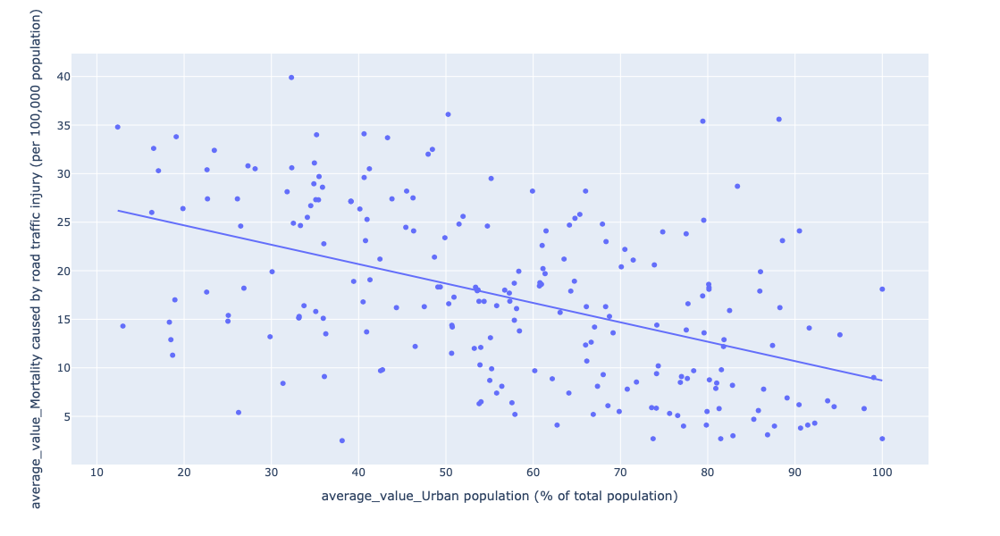

In [289]:
urban_latest = urban[urban["Year"] == 2020]
urban_gas = urban.dropna(subset=['Year', 'average_value_Urban population (% of total population)', 'average_value_Pump price for gasoline (US$ per liter)'])
urban_gas = urban_gas.sort_values('Year', ascending=False).drop_duplicates(subset='Country Name', keep='first')

urbanline = px.scatter(
    urban_gas,
    x='average_value_Urban population (% of total population)',
    y='average_value_Mortality caused by road traffic injury (per 100,000 population)',
    trendline = 'ols'
)
urbanline.update_layout(
    width = 800,
    height = 600,
)

urbanline.show()

/var/folders/vn/xnxk6ztx36qf8mb5zzjwrrs40000gp/T/ipykernel_4898/1050602937.py:26: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




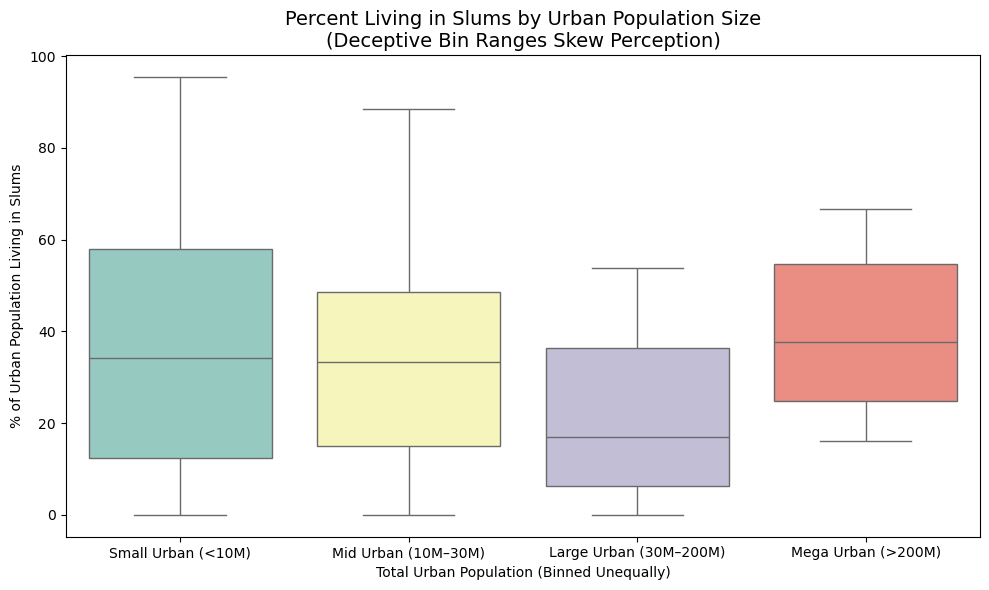

In [233]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Clean and deduplicate data
urban_gas = urban.dropna(subset=[
    'Year',
    'average_value_Urban population',
    'average_value_Population living in slums (% of urban population)'
])
urban_gas = urban_gas.sort_values('Year', ascending=False).drop_duplicates(subset='Country Name', keep='first')

# Create skewed bins (notice how the last bin is very wide)
bins = [0, 10_000_000, 60_000_000, 100_000_000, 1_000_000_000]
labels = ['Small Urban (<10M)', 'Mid Urban (10M–30M)', 'Large Urban (30M–200M)', 'Mega Urban (>200M)']

urban_gas['Urban Pop Bin'] = pd.cut(
    urban_gas['average_value_Urban population'],
    bins=bins,
    labels=labels,
    include_lowest=True
)

# Plot boxplot
plt.figure(figsize=(10, 6))
sns.boxplot(
    data=urban_gas,
    x='Urban Pop Bin',
    y='average_value_Population living in slums (% of urban population)',
    palette='Set3'
)
plt.title('Percent Living in Slums by Urban Population Size\n(Deceptive Bin Ranges Skew Perception)', fontsize=14)
plt.xlabel('Total Urban Population (Binned Unequally)')
plt.ylabel('% of Urban Population Living in Slums')
plt.tight_layout()
plt.show()


/var/folders/vn/xnxk6ztx36qf8mb5zzjwrrs40000gp/T/ipykernel_4898/431103211.py:25: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




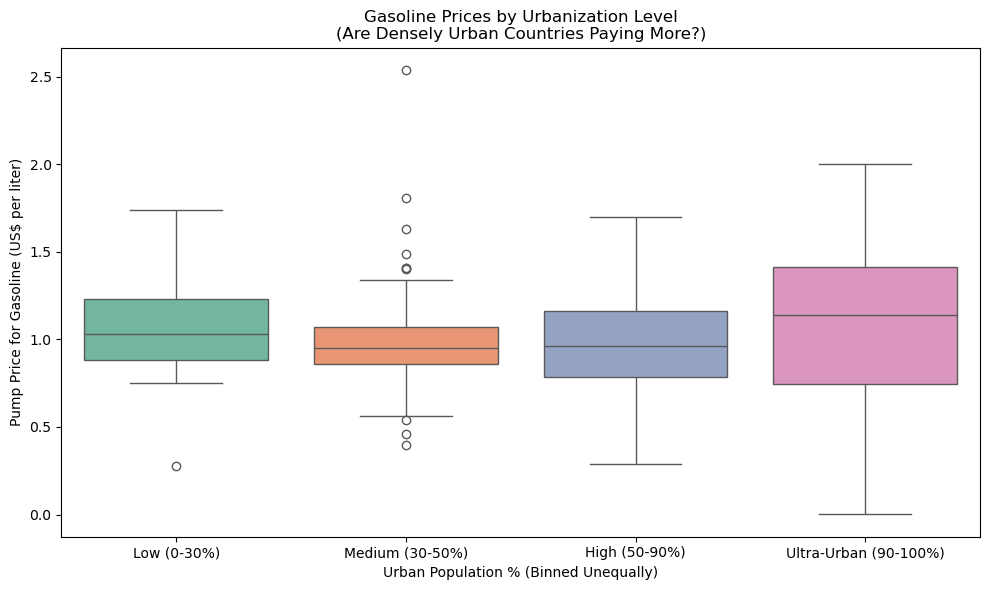

In [209]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Prepare the data
urban_gas = urban.dropna(subset=[
    'Year',
    'average_value_Urban population (% of total population)',
    'average_value_Pump price for gasoline (US$ per liter)'
])
urban_gas = urban_gas.sort_values('Year', ascending=False).drop_duplicates(subset='Country Name', keep='first')

# Create unequal bins
bins = [0, 20, 50, 70, 100]  # intentionally unequal
labels = ['Low (0-30%)', 'Medium (30-50%)', 'High (50-90%)', 'Ultra-Urban (90-100%)']
urban_gas['Urbanization Bin'] = pd.cut(
    urban_gas['average_value_Urban population (% of total population)'],
    bins=bins,
    labels=labels,
    include_lowest=True
)

# Plot deceptive box plot
plt.figure(figsize=(10, 6))
sns.boxplot(
    data=urban_gas,
    x='Urbanization Bin',
    y='average_value_Pump price for gasoline (US$ per liter)',
    palette='Set2'
)
plt.title('Gasoline Prices by Urbanization Level\n(Are Densely Urban Countries Paying More?)')
plt.xlabel('Urban Population % (Binned Unequally)')
plt.ylabel('Pump Price for Gasoline (US$ per liter)')
plt.tight_layout()
plt.show()

In [193]:
urban_usa = urban[urban["Country Code"] == "USA"]
urban_usa = urban_usa.sort_values(["Year"]).reset_index(drop=True)
urban_usa[urban

,Country Name,Country Code,Year,"average_value_Access to electricity, urban (% of urban population)","average_value_Mortality caused by road traffic injury (per 100,000 population)","average_value_PM2.5 air pollution, mean annual exposure (micrograms per cubic meter)","average_value_PM2.5 air pollution, population exposed to levels exceeding WHO guideline value (% of total)",average_value_Population density (people per sq. km of land area),average_value_Population in largest city,average_value_Population in the largest city (% of urban population),...,average_value_Population living in slums (% of urban population),average_value_Pump price for diesel fuel (US$ per liter),average_value_Pump price for gasoline (US$ per liter),average_value_Urban land area (sq. km),average_value_Urban land area where elevation is below 5 meters (% of total land area),average_value_Urban land area where elevation is below 5 meters (sq. km),average_value_Urban population,average_value_Urban population (% of total population),average_value_Urban population growth (annual %),average_value_Urban population living in areas where elevation is below 5 meters (% of total population)
0,United States,USA,1960,NaN,NaN,NaN,NaN,NaN,14163521.0,11.199782,...,NaN,NaN,NaN,NaN,NaN,NaN,126462473.0,69.996,NaN,NaN
1,United States,USA,1961,NaN,NaN,NaN,NaN,20.055880,14360388.0,11.108299,...,NaN,NaN,NaN,NaN,NaN,NaN,129276215.0,70.377,2.200571,NaN
2,United States,USA,1962,NaN,NaN,NaN,NaN,20.366723,14560269.0,11.031452,...,NaN,NaN,NaN,NaN,NaN,NaN,131988693.0,70.757,2.076494,NaN
3,United States,USA,1963,NaN,NaN,NaN,NaN,20.661953,14762931.0,10.966747,...,NaN,NaN,NaN,NaN,NaN,NaN,134615404.0,71.134,1.970559,NaN
4,United States,USA,1964,NaN,NaN,NaN,NaN,20.950959,14968700.0,10.908860,...,NaN,NaN,NaN,NaN,NaN,NaN,137215986.0,71.508,1.913437,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
56,United States,USA,2016,100.0,12.9,7.406464,3.334436,35.318347,18704696.0,7.072441,...,NaN,0.65,0.71,NaN,NaN,NaN,264473000.0,81.862,0.958268,NaN
57,United States,USA,2017,100.0,12.8,7.409442,3.343170,35.542495,18761941.0,7.032509,...,NaN,NaN,NaN,NaN,NaN,NaN,266788716.0,82.058,0.871785,NaN
58,United States,USA,2018,100.0,12.6,NaN,NaN,35.730096,18819361.0,7.000104,...,NaN,NaN,NaN,NaN,NaN,NaN,268844029.0,82.256,0.767437,NaN
59,United States,USA,2019,100.0,12.7,NaN,NaN,35.893176,18804722.0,6.945737,...,NaN,NaN,NaN,NaN,NaN,NaN,270737596.0,82.459,0.701868,NaN


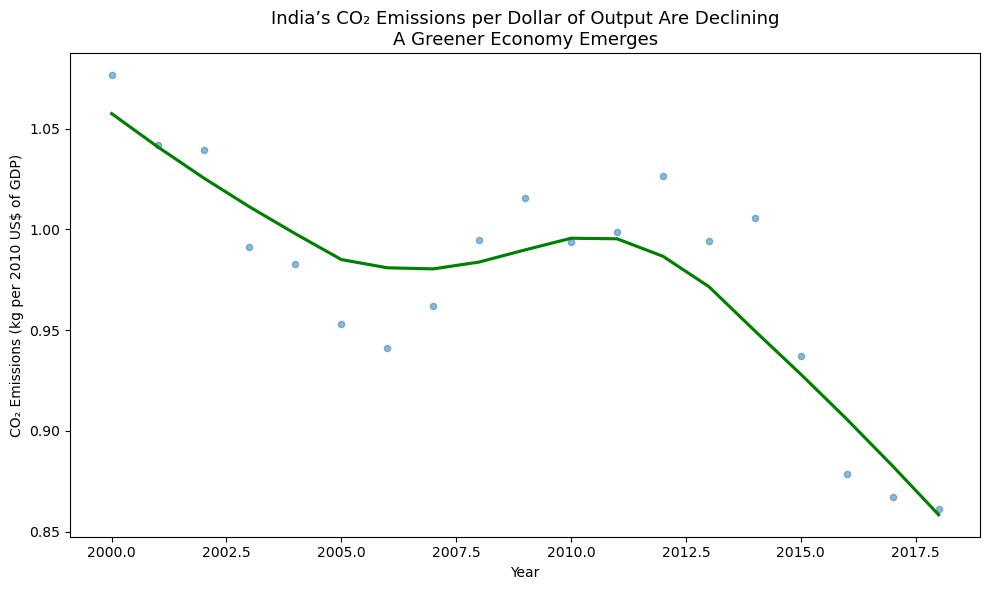

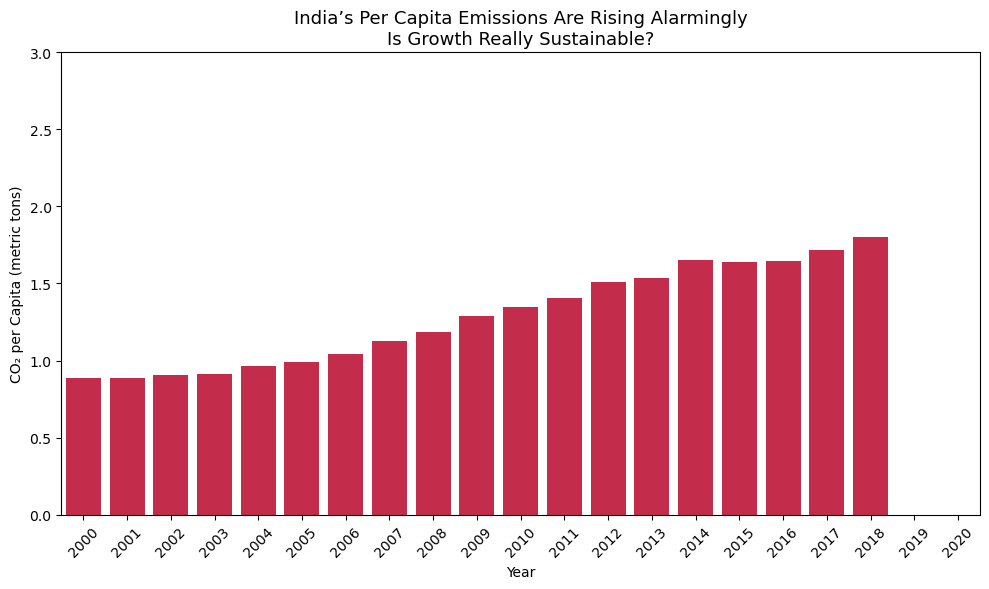

In [65]:
# Imports
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load CSVs
complaints = pd.read_csv("complaints.csv")
climate = pd.read_csv("climate-change.csv")
finance = pd.read_csv("financial-sector.csv")
health = pd.read_csv("health.csv")
poverty = pd.read_csv("poverty.csv")
social = pd.read_csv("social-development.csv")
urban = pd.read_csv("urban-development.csv")

# === PROPOSITION ===
# "India has successfully reduced the carbon intensity of its economic growth since 2000."

# Filter for India and Year >= 2000
india_climate = climate[
    (climate["Country Name"] == "India") &
    (climate["Year"] >= 2000)
]

# === EARNEST VISUALIZATION ===
plt.figure(figsize=(10, 6))
sns.regplot(
    data=india_climate,
    x="Year",
    y="average_value_CO2 emissions (kg per 2010 US$ of GDP)",
    lowess=True,
    scatter_kws={'s': 20, 'alpha': 0.5},
    line_kws={'color': 'green'}
)
plt.title("India’s CO₂ Emissions per Dollar of Output Are Declining\nA Greener Economy Emerges", fontsize=13)
plt.xlabel("Year")
plt.ylabel("CO₂ Emissions (kg per 2010 US$ of GDP)")
plt.tight_layout()
plt.savefig("earnest_graph_india_gdp.png")
plt.show()

# === DECEPTIVE VISUALIZATION ===
plt.figure(figsize=(10, 6))
sns.barplot(
    data=india_climate,
    x="Year",
    y="average_value_CO2 emissions (metric tons per capita)",
    color="crimson"
)
plt.ylim(0, 3)  # Narrow y-axis to exaggerate rise
plt.title("India’s Per Capita Emissions Are Rising Alarmingly\nIs Growth Really Sustainable?", fontsize=13)
plt.xlabel("Year")
plt.ylabel("CO₂ per Capita (metric tons)")
plt.xticks(rotation=45)
plt.tight_layout()
plt.savefig("deceptive_graph_india_percapita.png")
plt.show()


In [66]:
poverty.shape

(2924, 32)

In [67]:
poverty.columns

Index(['Country Name', 'Country Code', 'Year',
       'average_value_Annualized average growth rate in per capita real survey mean consumption or income, bottom 40% of population (%)',
       'average_value_Annualized average growth rate in per capita real survey mean consumption or income, total population (%)',
       'average_value_Gini index (World Bank estimate)',
       'average_value_Income share held by fourth 20%',
       'average_value_Income share held by highest 10%',
       'average_value_Income share held by highest 20%',
       'average_value_Income share held by lowest 10%',
       'average_value_Income share held by lowest 20%',
       'average_value_Income share held by second 20%',
       'average_value_Income share held by third 20%',
       'average_value_Multidimensional poverty headcount ratio (% of total population)',
       'average_value_Multidimensional poverty headcount ratio, children (% of population ages 0-17)',
       'average_value_Multidimensional pove

In [68]:
usapov = poverty[poverty["Country Code"] == "USA"]
usapov

,Country Name,Country Code,Year,"average_value_Annualized average growth rate in per capita real survey mean consumption or income, bottom 40% of population (%)","average_value_Annualized average growth rate in per capita real survey mean consumption or income, total population (%)",average_value_Gini index (World Bank estimate),average_value_Income share held by fourth 20%,average_value_Income share held by highest 10%,average_value_Income share held by highest 20%,average_value_Income share held by lowest 10%,...,average_value_Poverty gap at $1.90 a day (2011 PPP) (%),average_value_Poverty gap at $3.20 a day (2011 PPP) (%),average_value_Poverty gap at $5.50 a day (2011 PPP) (%),average_value_Poverty headcount ratio at $1.90 a day (2011 PPP) (% of population),average_value_Poverty headcount ratio at $3.20 a day (2011 PPP) (% of population),average_value_Poverty headcount ratio at $5.50 a day (2011 PPP) (% of population),average_value_Poverty headcount ratio at national poverty lines (% of population),average_value_Proportion of people living below 50 percent of median income (%),"average_value_Survey mean consumption or income per capita, bottom 40% of population (2011 PPP $ per day)","average_value_Survey mean consumption or income per capita, total population (2011 PPP $ per day)"
45,United States,USA,2005,NaN,NaN,41.0,22.3,30.8,46.5,1.8,...,0.8,0.9,1.1,1.0,1.2,1.5,NaN,17.7,NaN,NaN
351,United States,USA,2008,NaN,NaN,40.8,22.5,30.3,46.2,1.7,...,0.9,1.0,1.2,1.0,1.2,1.7,NaN,18.2,NaN,NaN
476,United States,USA,2017,NaN,NaN,41.2,22.7,30.3,46.6,1.7,...,1.0,1.1,1.3,1.2,1.5,1.7,NaN,18.2,NaN,NaN
545,United States,USA,2002,NaN,NaN,40.4,22.5,30.1,45.9,1.8,...,0.6,0.7,0.9,0.7,1.0,1.5,NaN,18.2,NaN,NaN
627,United States,USA,1993,NaN,NaN,40.4,22.8,29.7,45.8,1.8,...,0.4,0.5,0.7,0.5,0.7,1.2,NaN,19.0,NaN,NaN
1040,United States,USA,2004,NaN,NaN,40.3,22.5,30.1,45.8,1.8,...,0.8,0.9,1.1,1.0,1.2,1.7,NaN,17.7,NaN,NaN
1056,United States,USA,2014,NaN,NaN,41.5,22.4,30.6,47.2,1.7,...,1.0,1.1,1.4,1.2,1.5,2.0,NaN,17.0,NaN,NaN
1146,United States,USA,1998,NaN,NaN,40.0,22.5,29.7,45.6,1.9,...,0.6,0.7,0.9,0.7,1.0,1.5,NaN,18.0,NaN,NaN
1207,United States,USA,1986,NaN,NaN,37.4,23.6,26.7,43.1,2.0,...,0.4,0.5,0.7,0.5,0.7,1.2,NaN,18.0,NaN,NaN
1237,United States,USA,2011,NaN,NaN,40.9,22.6,30.2,46.4,1.8,...,0.8,0.9,1.2,1.0,1.2,1.7,NaN,18.0,NaN,NaN


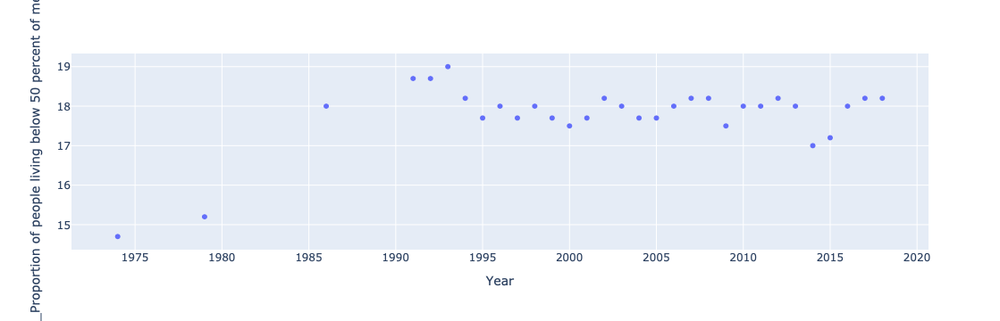

In [73]:
x_ax = "Year"
y_ax = 'average_value_Proportion of people living below 50 percent of median income (%)'
scatterpov = px.scatter(usapov, x=x_ax, y=y_ax)
scatterpov

In [75]:
climate.columns

Index(['Country Name', 'Country Code', 'Year',
       'average_value_Access to electricity (% of population)',
       'average_value_Agricultural land (% of land area)',
       'average_value_Agricultural land (sq. km)',
       'average_value_Agriculture, forestry, and fishing, value added (% of GDP)',
       'average_value_Annual freshwater withdrawals, total (% of internal resources)',
       'average_value_Annual freshwater withdrawals, total (billion cubic meters)',
       'average_value_Arable land (% of land area)',
       'average_value_CO2 emissions (kg per 2010 US$ of GDP)',
       'average_value_CO2 emissions (kg per 2017 PPP $ of GDP)',
       'average_value_CO2 emissions (kt)',
       'average_value_CO2 emissions (metric tons per capita)',
       'average_value_CO2 emissions from gaseous fuel consumption (% of total)',
       'average_value_CO2 emissions from gaseous fuel consumption (kt)',
       'average_value_CO2 emissions from liquid fuel consumption (% of total)',
    

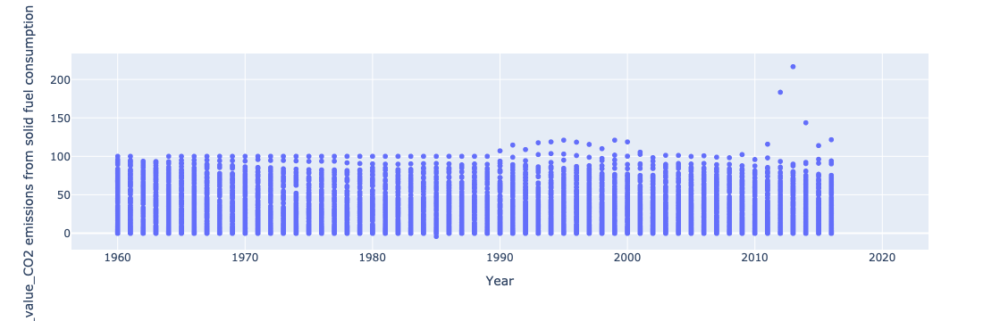

In [77]:
usaclim = climate[climate["Country Code"] == "USA"]

x_ax = "Year"
y_ax = 'average_value_CO2 emissions from solid fuel consumption (% of total)'
scatterclim = px.scatter(climate, x=x_ax, y=y_ax)
scatterclim

In [79]:
x_ax = "Year"
y_ax = 'average_value_Urban population growth (annual %)'
naclim = climate[(climate["Country Code"] == "USA") | (climate["Country Code"] == "CAN")].sort_values(by=['Country Name', 'Year'])

In [80]:
lineclim = px.line(naclim, x=x_ax, y=y_ax, color='Country Name')

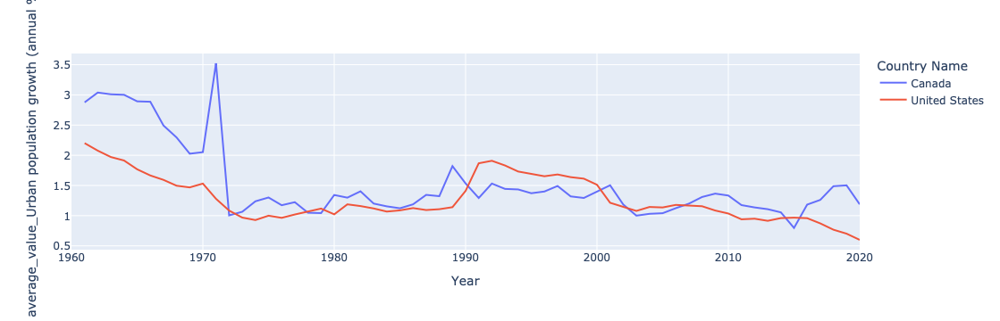

In [83]:
lineclim

In [85]:
complaints

,unique_mos_id,first_name,last_name,command_now,shield_no,complaint_id,month_received,year_received,month_closed,year_closed,...,mos_age_incident,complainant_ethnicity,complainant_gender,complainant_age_incident,fado_type,allegation,precinct,contact_reason,outcome_description,board_disposition
0,10004,Jonathan,Ruiz,078 PCT,8409,42835,7,2019,5,2020,...,32,Black,Female,38.0,Abuse of Authority,Failure to provide RTKA card,78.0,Report-domestic dispute,No arrest made or summons issued,Substantiated (Command Lvl Instructions)
1,10007,John,Sears,078 PCT,5952,24601,11,2011,8,2012,...,24,Black,Male,26.0,Discourtesy,Action,67.0,Moving violation,Moving violation summons issued,Substantiated (Charges)
2,10007,John,Sears,078 PCT,5952,24601,11,2011,8,2012,...,24,Black,Male,26.0,Offensive Language,Race,67.0,Moving violation,Moving violation summons issued,Substantiated (Charges)
3,10007,John,Sears,078 PCT,5952,26146,7,2012,9,2013,...,25,Black,Male,45.0,Abuse of Authority,Question,67.0,PD suspected C/V of violation/crime - street,No arrest made or summons issued,Substantiated (Charges)
4,10009,Noemi,Sierra,078 PCT,24058,40253,8,2018,2,2019,...,39,NaN,NaN,16.0,Force,Physical force,67.0,Report-dispute,Arrest - other violation/crime,Substantiated (Command Discipline A)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
33353,9992,Tomasz,Pulawski,078 PCT,2642,35671,8,2016,2,2017,...,36,Asian,Male,21.0,Discourtesy,Word,66.0,Moving violation,Moving violation summons issued,Unsubstantiated
33354,9992,Tomasz,Pulawski,078 PCT,2642,35671,8,2016,2,2017,...,36,Asian,Male,21.0,Abuse of Authority,Interference with recording,66.0,Moving violation,Moving violation summons issued,Unsubstantiated
33355,9992,Tomasz,Pulawski,078 PCT,2642,35671,8,2016,2,2017,...,36,Asian,Male,21.0,Abuse of Authority,Search (of person),66.0,Moving violation,Moving violation summons issued,Substantiated (Formalized Training)
33356,9992,Tomasz,Pulawski,078 PCT,2642,35671,8,2016,2,2017,...,36,Asian,Male,21.0,Abuse of Authority,Vehicle search,66.0,Moving violation,Moving violation summons issued,Substantiated (Formalized Training)


In [87]:
complaints.columns

Index(['unique_mos_id', 'first_name', 'last_name', 'command_now', 'shield_no',
       'complaint_id', 'month_received', 'year_received', 'month_closed',
       'year_closed', 'command_at_incident', 'rank_abbrev_incident',
       'rank_abbrev_now', 'rank_now', 'rank_incident', 'mos_ethnicity',
       'mos_gender', 'mos_age_incident', 'complainant_ethnicity',
       'complainant_gender', 'complainant_age_incident', 'fado_type',
       'allegation', 'precinct', 'contact_reason', 'outcome_description',
       'board_disposition'],
      dtype='object')

In [89]:
complaints["year_received"].value_counts()

year_received
2016    2345
2015    2312
2018    2281
2014    2220
2017    2178
2013    2114
2011    1896
2007    1892
2012    1841
2009    1761
2010    1659
2006    1654
2019    1642
2008    1631
2005    1345
2004     972
2003     792
2002     571
2001     344
1996     254
1998     250
2000     232
1997     214
1995     213
1994     177
1999     155
1992      88
1993      76
1991      56
1990      54
1989      49
1988      35
1986      22
1987      22
1985       7
2020       4
Name: count, dtype: int64

In [91]:
grouped_eth = complaints.groupby(["year_received", "complainant_ethnicity"]).count()
grouped_cause = complaints.groupby(["year_received", "fado_type"]).count()

grouped_cause

unique_mos_id  first_name  last_name  \
year_received fado_type                                                  
1985          Abuse of Authority              3           3          3   
              Discourtesy                     1           1          1   
              Force                           3           3          3   
1986          Abuse of Authority              8           8          8   
              Discourtesy                     4           4          4   
...                                         ...         ...        ...   
2019          Abuse of Authority           1259        1259       1259   
              Discourtesy                   179         179        179   
              Force                         173         173        173   
              Offensive Language             31          31         31   
2020          Abuse of Authority              4           4          4   

                                  command_now  shield_no  complaint_id  \
year_received fado_type                                                  
1985          Abuse of Authority            3          3             3   
              Discourtesy                   1          1             1   
              Force                         3          3             3   
1986          Abuse of Authority            8          8             8   
              Discourtesy                   4          4             4   
...                                       ...        ...           ...   
2019          Abuse of Authority         1259       1259          1259   
              Discourtesy                 179        179           179   
              Force                       173        173           173   
              Offensive Language           31         31            31   
2020          Abuse of Authority            4          4             4   

                                  month_received  month_closed  year_closed  \
year_received fado_type                                                       
1985          Abuse of Authority               3             3            3   
              Discourtesy                      1             1            1   
              Force                            3             3            3   
1986          Abuse of Authority               8             8            8   
              Discourtesy                      4             4            4   
...                                          ...           ...          ...   
2019          Abuse of Authority            1259          1259         1259   
              Discourtesy                    179           179          179   
              Force                          173           173          173   
              Offensive Language              31            31           31   
2020          Abuse of Authority               4             4            4   

                                  command_at_incident  ...  mos_gender  \
year_received fado_type                                ...               
1985          Abuse of Authority                    0  ...           3   
              Discourtesy                           0  ...           1   
              Force                                 0  ...           3   
1986          Abuse of Authority                    0  ...           8   
              Discourtesy                           0  ...           4   
...                                               ...  ...         ...   
2019          Abuse of Authority                 1259  ...        1259   
              Discourtesy                         179  ...         179   
              Force                               173  ...         173   
              Offensive Language                   31  ...          31   
2020          Abuse of Authority                    4  ...           4   

                                  mos_age_incident  complainant_ethnicity  \
year_received fado_type                 

In [97]:
abortions = pd.read_excel("abortions.xlsx")

In [103]:
abortions.columns

Index(['U.S. State', '% change in abortion rate, 2017-2020',
       '% change in the no. of abortion clinics, 2017-2020',
       '% change in the no. of abortion providers, 2014-2017',
       '% of all U.S. abortions, by state of occurrence, 2020',
       '% of counties without a known abortion provider, 2014',
       '% of counties without a known clinic, 2020',
       '% of residents obtaining abortions who traveled out of state for care, 2020',
       '% of women aged 15-44 living in a county without a clinic, 2020',
       '% of women aged 15-44 living in a county without an abortion provider, 2014',
       'Abortion rate (the no. of abortions per 1,000 women aged 15-17), by state of residence, 2017',
       'Abortion rate (the no. of abortions per 1,000 women aged 15-19), by state of residence, 2017',
       'Abortion rate (the no. of abortions per 1,000 women aged 18-19), by state of residence, 2017',
       'Change in the no. of abortion clinics, 2017-2020',
       'Change in th

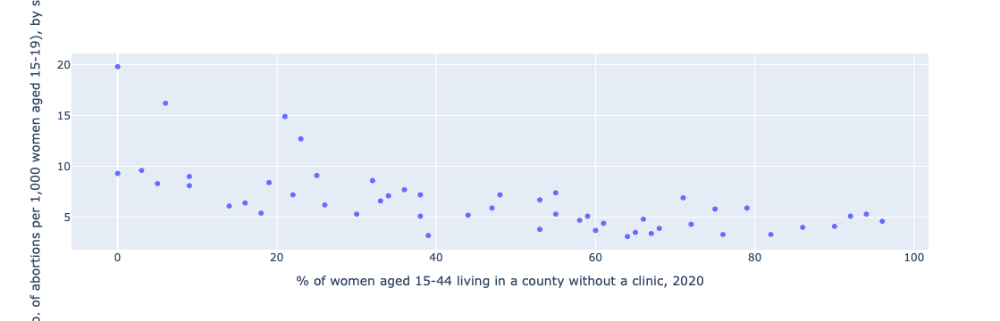

In [115]:
xa = '% of women aged 15-44 living in a county without a clinic, 2020'
ya = 'Abortion rate (the no. of abortions per 1,000 women aged 15-19), by state of residence, 2017'
abortions = abortions.sort_values(["No. of abortion providers, 2017"])
ab = px.scatter(abortions, x=xa, y=ya)
ab

In [117]:
health.head()

,Country Name,Country Code,Year,average_value_Age dependency ratio (% of working-age population),"average_value_Age dependency ratio, old (% of working-age population)","average_value_Age dependency ratio, young (% of working-age population)","average_value_Population ages 15-19, female (% of female population)","average_value_Population ages 15-19, male (% of male population)",average_value_Population ages 15-64 (% of total population),"average_value_Population ages 15-64, female",...,"average_value_Population ages 75-79, male (% of male population)","average_value_Population ages 80 and above, female (% of female population)","average_value_Population ages 80 and above, male (% of male population)",average_value_Population growth (annual %),"average_value_Population, female","average_value_Population, female (% of total population)","average_value_Population, male","average_value_Population, male (% of total population)","average_value_Population, total",average_value_Sex ratio at birth (male births per female births)
0,Africa Eastern and Southern,AFE,1987,95.708298,5.882134,89.480785,10.307609,10.487556,51.186787,72392618.0,...,0.458477,0.373032,0.273595,3.001095,140550131.0,50.343093,138634405.0,49.656907,279184536.0,1.0306
1,Albania,ALB,1977,75.336069,9.184205,66.151864,11.259393,11.074637,57.033333,690454.0,...,0.846029,1.025027,0.678726,2.213252,1223320.0,48.669087,1290226.0,51.330913,2513546.0,1.0740
2,Albania,ALB,2019,46.203522,20.764736,25.438786,6.937491,7.489100,68.397805,955875.0,...,2.770345,3.134511,2.566770,-0.426007,1401011.0,49.086106,1453180.0,50.913894,2854191.0,1.0840
3,Armenia,ARM,2020,48.445528,17.520850,30.924678,5.049166,6.545736,67.364776,1066362.0,...,1.144038,3.790793,2.309314,0.185983,1569487.0,52.965341,1393747.0,47.034659,2963234.0,NaN
4,Azerbaijan,AZE,2013,39.516803,7.947811,31.568992,8.046544,8.794393,71.675957,3433875.0,...,1.230942,1.371669,0.775832,1.293447,4738628.0,50.320991,4678173.0,49.679009,9416801.0,1.1510


In [121]:
# Ensure 'Year' is numeric
health['Year'] = pd.to_numeric(health['Year'], errors='coerce')

# Drop rows where 'Year' is missing
health_cleaned = health.dropna(subset=['Year'])

# Keep the most recent year for each country
health_latest = health_cleaned.sort_values('Year', ascending=False).drop_duplicates(subset='Country Name', keep='first')

# Optional: sort alphabetically by country name
health_latest = health_latest.sort_values('Country Name').reset_index(drop=True)

health_latest

,Country Name,Country Code,Year,average_value_Age dependency ratio (% of working-age population),"average_value_Age dependency ratio, old (% of working-age population)","average_value_Age dependency ratio, young (% of working-age population)","average_value_Population ages 15-19, female (% of female population)","average_value_Population ages 15-19, male (% of male population)",average_value_Population ages 15-64 (% of total population),"average_value_Population ages 15-64, female",...,"average_value_Population ages 75-79, male (% of male population)","average_value_Population ages 80 and above, female (% of female population)","average_value_Population ages 80 and above, male (% of male population)",average_value_Population growth (annual %),"average_value_Population, female","average_value_Population, female (% of total population)","average_value_Population, male","average_value_Population, male (% of total population)","average_value_Population, total",average_value_Sex ratio at birth (male births per female births)
0,Afghanistan,AFG,2020,80.088259,4.770664,75.317595,11.879986,11.903832,55.528329,1.045206e+07,...,0.384942,0.318414,0.228166,2.303812,1.895208e+07,48.684520,1.997626e+07,51.315480,3.892834e+07,NaN
1,Africa Eastern and Southern,AFE,2020,80.846986,5.722296,74.220260,10.636080,10.889350,55.573291,1.904722e+08,...,0.458409,0.490065,0.303197,2.605427,3.410907e+08,50.364579,3.361526e+08,49.635421,6.772433e+08,NaN
2,Africa Western and Central,AFW,2020,85.291271,5.152082,79.732517,10.643869,10.806711,54.087793,1.237987e+08,...,0.414178,0.292431,0.214851,2.660902,2.279854e+08,49.691303,2.308180e+08,50.308697,4.588035e+08,NaN
3,Albania,ALB,2020,46.930109,21.605453,25.324655,6.608161,7.251791,68.059561,9.446020e+05,...,2.828470,3.230306,2.667483,-0.577942,1.393417e+06,49.102995,1.444326e+06,50.897005,2.837743e+06,NaN
4,Algeria,DZA,2020,60.067725,10.793250,49.274474,6.571635,6.700798,62.473557,1.358423e+07,...,1.091519,1.417863,1.210483,1.836534,2.169724e+07,49.479405,2.215381e+07,50.520595,4.385104e+07,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
260,West Bank and Gaza,PSE,2020,71.165883,5.504690,65.661193,10.111575,10.158985,58.422861,1.384634e+06,...,0.518908,0.519081,0.354701,2.486550,2.367491e+06,49.289158,2.435778e+06,50.710842,4.803269e+06,NaN
261,World,WLD,2020,54.568672,14.292980,39.101335,7.658800,8.068126,65.191464,2.489015e+09,...,1.391583,2.316166,1.422606,1.035991,3.842820e+09,49.584543,3.907216e+09,50.415457,7.752841e+09,NaN
262,"Yemen, Rep.",YEM,2020,71.712774,5.032872,66.679902,10.634915,10.832097,58.236787,8.647645e+06,...,0.425258,0.406041,0.269178,2.251561,1.480098e+07,49.624485,1.502498e+07,50.375515,2.982597e+07,NaN
263,Zambia,ZMB,2020,85.698982,3.959143,81.739839,11.413228,11.670068,53.850589,5.033425e+06,...,0.266472,0.346279,0.149072,2.885686,9.280950e+06,50.483965,9.103006e+06,49.516035,1.838396e+07,NaN


In [123]:
health_latest.columns

Index(['Country Name', 'Country Code', 'Year',
       'average_value_Age dependency ratio (% of working-age population)',
       'average_value_Age dependency ratio, old (% of working-age population)',
       'average_value_Age dependency ratio, young (% of working-age population)',
       'average_value_Population ages 15-19, female (% of female population)',
       'average_value_Population ages 15-19, male (% of male population)',
       'average_value_Population ages 15-64 (% of total population)',
       'average_value_Population ages 15-64, female',
       'average_value_Population ages 15-64, female (% of female population)',
       'average_value_Population ages 15-64, male',
       'average_value_Population ages 15-64, male (% of male population)',
       'average_value_Population ages 15-64, total',
       'average_value_Population ages 20-24, female (% of female population)',
       'average_value_Population ages 20-24, male (% of male population)',
       'average_value_Pop

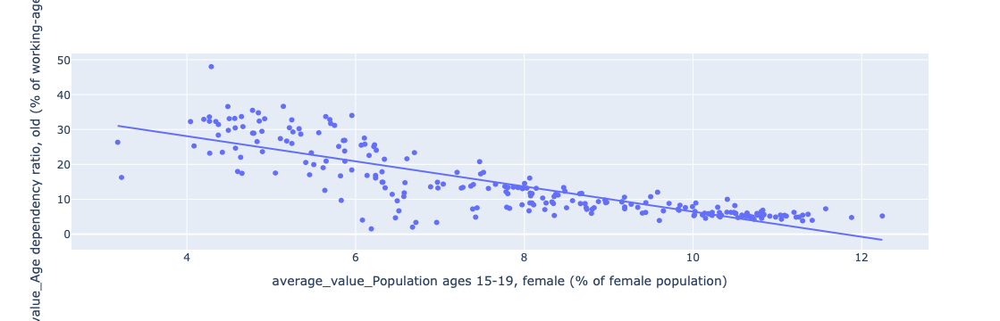

In [267]:
ax = 'average_value_Population ages 15-19, female (% of female population)'
ay = 'average_value_Age dependency ratio, old (% of working-age population)'
healthline1 = px.scatter(health_latest, x=ax, y=ay, trendline="ols")
healthline1

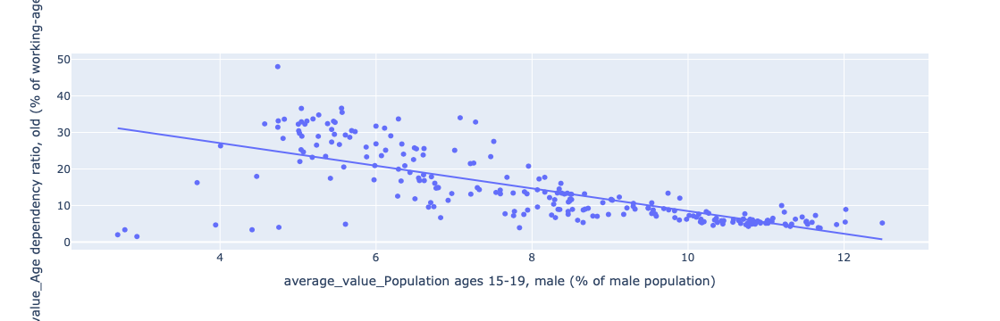

In [269]:
ax = 'average_value_Population ages 15-19, male (% of male population)'
ay = 'average_value_Age dependency ratio, old (% of working-age population)'
healthline2 = px.scatter(health_latest, x=ax, y=ay, trendline="ols")
healthline2

In [375]:
# Ensure 'Year' is numeric
climate['Year'] = pd.to_numeric(climate['Year'], errors='coerce')

# Drop rows where 'Year' is missing
climate_cleaned = climate.dropna(subset=['Year',  'average_value_Forest area (% of land area)'])

# Keep the most recent year for each country
climate_latest = climate_cleaned.sort_values('Year', ascending=False).drop_duplicates(subset='Country Name', keep='first')

# Optional: sort alphabetically by country name
climate_latest = climate_latest.sort_values('Country Name').reset_index(drop=True)

In [377]:
climate.columns

Index(['Country Name', 'Country Code', 'Year',
       'average_value_Access to electricity (% of population)',
       'average_value_Agricultural land (% of land area)',
       'average_value_Agricultural land (sq. km)',
       'average_value_Agriculture, forestry, and fishing, value added (% of GDP)',
       'average_value_Annual freshwater withdrawals, total (% of internal resources)',
       'average_value_Annual freshwater withdrawals, total (billion cubic meters)',
       'average_value_Arable land (% of land area)',
       'average_value_CO2 emissions (kg per 2010 US$ of GDP)',
       'average_value_CO2 emissions (kg per 2017 PPP $ of GDP)',
       'average_value_CO2 emissions (kt)',
       'average_value_CO2 emissions (metric tons per capita)',
       'average_value_CO2 emissions from gaseous fuel consumption (% of total)',
       'average_value_CO2 emissions from gaseous fuel consumption (kt)',
       'average_value_CO2 emissions from liquid fuel consumption (% of total)',
    

In [379]:
climate_latest.head()

,Country Name,Country Code,Year,average_value_Access to electricity (% of population),average_value_Agricultural land (% of land area),average_value_Agricultural land (sq. km),"average_value_Agriculture, forestry, and fishing, value added (% of GDP)","average_value_Annual freshwater withdrawals, total (% of internal resources)","average_value_Annual freshwater withdrawals, total (billion cubic meters)",average_value_Arable land (% of land area),...,"average_value_School enrollment, primary and secondary (gross), gender parity index (GPI)",average_value_Terrestrial and marine protected areas (% of total territorial area),average_value_Terrestrial protected areas (% of total land area),average_value_Total greenhouse gas emissions (kt of CO2 equivalent),average_value_Urban land area where elevation is below 5 meters (% of total land area),average_value_Urban land area where elevation is below 5 meters (sq. km),average_value_Urban population,average_value_Urban population (% of total population),average_value_Urban population growth (annual %),average_value_Urban population living in areas where elevation is below 5 meters (% of total population)
0,Afghanistan,AFG,2020,NaN,NaN,NaN,27.013561,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,10131490.0,26.026000,3.354421,NaN
1,Africa Eastern and Southern,AFE,2020,NaN,NaN,NaN,11.456951,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,249112475.0,36.783306,3.996400,NaN
2,Africa Western and Central,AFW,2020,NaN,NaN,NaN,22.642555,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,219531155.0,47.848625,3.977272,NaN
3,Albania,ALB,2020,NaN,NaN,NaN,19.252098,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,1762579.0,62.112000,0.853866,NaN
4,Algeria,DZA,2020,NaN,NaN,NaN,14.227723,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,32332690.0,73.733000,2.577066,NaN


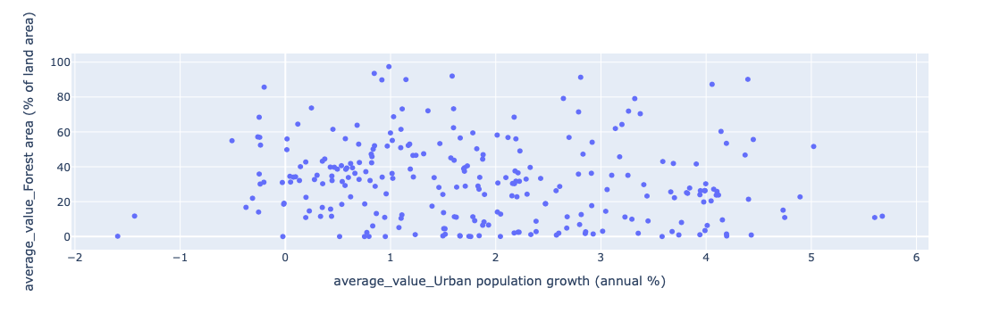

In [381]:
cliscat = px.scatter(
    climate_latest, 
    x= 'average_value_Urban population growth (annual %)',
    y=  'average_value_Forest area (% of land area)'
)

cliscat.show()

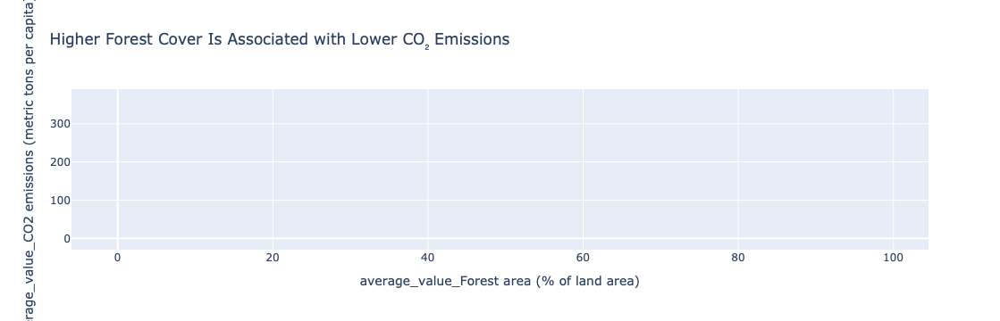

In [365]:
df = climate_latest.dropna(subset=[
    'average_value_Forest area (% of land area)',
    'average_value_CO2 emissions (metric tons per capita)'
])

fig = px.scatter(
    climate,
    x='average_value_Forest area (% of land area)',
    y='average_value_CO2 emissions (metric tons per capita)',
    trendline='ols',
    title="Higher Forest Cover Is Associated with Lower CO₂ Emissions"
)
fig.show()


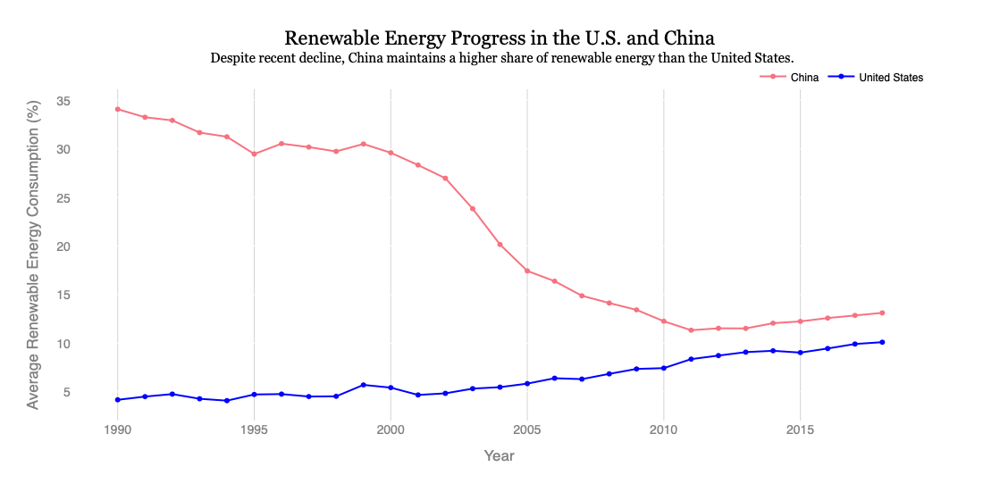

In [495]:
# Choose countries
country_1 = "United States"
country_2 = "China"

# Filter rows for selected countries and non-missing years and values
column1 = 'average_value_Renewable energy consumption (% of total final energy consumption)'

subset = climate[
    (climate['Country Name'].isin([country_1, country_2])) &
    (climate[column1].notna()) &
    (climate['Year'].notna())
].copy()

# Ensure Year is numeric
subset['Year'] = pd.to_numeric(subset['Year'], errors='coerce')

# Group by country and year, take average if duplicates exist
grouped = subset.groupby(['Country Name', 'Year'])[column1].mean().reset_index()

# Sort for proper line connection
grouped = grouped.sort_values(by=['Country Name', 'Year'])

fig = px.line(
    grouped,
    x='Year',
    y=column1,
    color='Country Name',
    markers=True,
    title="""Renewable Energy Progress in the U.S. and China<br>
    <sup>Despite recent decline, China maintains a higher share of renewable energy than the United States.</sup><br>""",
    labels={
        column1: 'Average Renewable Energy Consumption (% of Total)'
    },
    color_discrete_map={
        'United States': 'blue',
        'China': '#f67280'
    }
)

# Apply same custom styling
fig.update_layout(
    width=850,
    height=550,
    plot_bgcolor='white',
    paper_bgcolor='white',
    font=dict(family='Helvetica', size=14, color='gray'),
    title=dict(
        font=dict(size=22, family='Georgia, serif', color='black'),
        x=0.5
    ),
    xaxis=dict(
        title='Year',
        showgrid=True,
        gridcolor='lightgray'
    ),
    yaxis=dict(
        title='Average Renewable Energy Consumption (%)',
        showgrid=True
    ),
    legend=dict(
        title_text='',
        orientation='h',
        yanchor='bottom',
        y=1.0,
        xanchor='right',
        x=1,
        font=dict(size=12, color='black')
    )
)

fig.show()


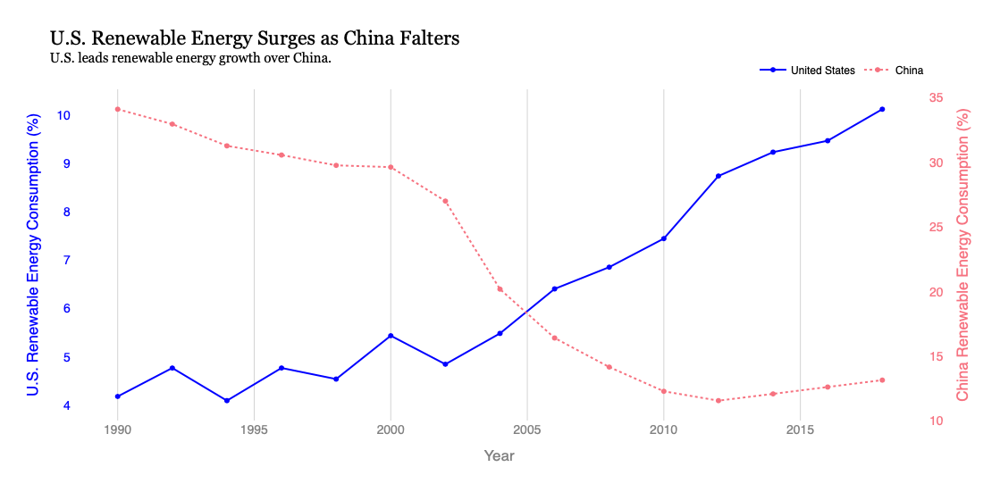

In [483]:
import plotly.graph_objects as go

# Filter to every 2 years (even years)
us_data_filtered = us_data[us_data['Year'] % 2 == 0]
china_data_filtered = china_data[china_data['Year'] % 2 == 0]

# Create dual-axis figure
fig = go.Figure()

# U.S. line (left y-axis)
fig.add_trace(go.Scatter(
    x=us_data_filtered['Year'],
    y=us_data_filtered[column1],
    mode='lines+markers',
    name='United States',
    line=dict(color='blue'),
    yaxis='y1',
))

# China line (right y-axis)
fig.add_trace(go.Scatter(
    x=china_data_filtered['Year'],
    y=china_data_filtered[column1],
    mode='lines+markers',
    name='China',
    line=dict(color='#f67280', dash='dot'),
    yaxis='y2',
))

# Layout with dual axes
fig.update_layout(
    title="U.S. Renewable Energy Surges as China Falters<br><sup>U.S. leads renewable energy growth over China.</sup><br>",
    xaxis=dict(
        title='Year',
        showgrid=True,
        gridcolor='lightgray'
    ),
    yaxis=dict(
        title='U.S. Renewable Energy Consumption (%)',
        titlefont=dict(color='blue'),
        tickfont=dict(color='blue'),
        showgrid=False
    ),
    yaxis2=dict(
        title='China Renewable Energy Consumption (%)',
        titlefont=dict(color='#f67280'),
        tickfont=dict(color='#f67280'),
        overlaying='y',
        side='right',
        showgrid=False
    ),
    plot_bgcolor='white',
    paper_bgcolor='white',
    width=850,
    height=550,
    font=dict(family='Helvetica', size=14, color='gray'),
    legend=dict(
        orientation='h',
        yanchor='bottom',
        y=1.02,
        xanchor='right',
        x=1,
        font=dict(size=12, color='black')
    ),
    title_font=dict(size=22, family='Georgia, serif', color='black')
)

fig.show()
